In [3894]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [3895]:
np.random.seed(42)

In [3896]:
cluster_generator = CorrelatedClusterGenerator(n_samples=5000,n_features=20,n_clusters=5,correlation=0.2,random_state=42)

In [3897]:
X, y = cluster_generator.generate_clusters()

In [3898]:
X = X + np.random.normal(scale=10,size=X.shape) 

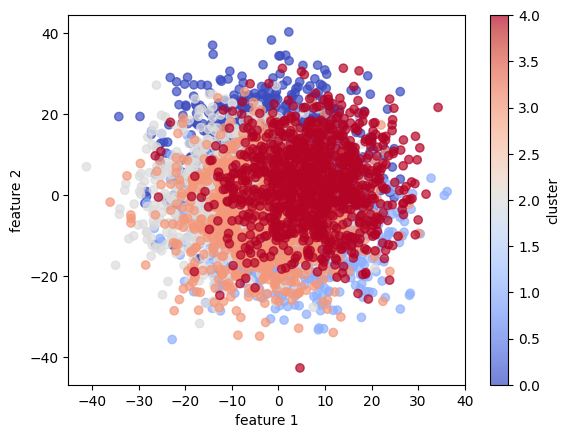

In [3899]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

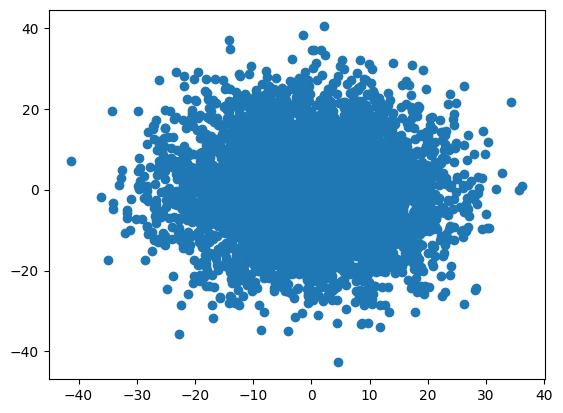

In [3900]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [3901]:
corr_dataset = pd.DataFrame(X) 

In [3902]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [3903]:
corr_dataset['target'] = y

In [3904]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,19.939385,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,17.207886,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,7.574337,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,8.009050,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,22.303609,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,-2.372837,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,1.317649,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,-3.533962,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,-8.515933,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4


In [3905]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [3906]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.017146,0.029904,-0.208972,0.053096,-0.047950,0.121029,-0.014369,0.118829,-0.003703,-0.181895,-0.058808,-0.070063,-0.043382,0.111332,-0.055485,0.070591,0.030936,0.027431,-0.029933
vab_2,-0.017146,1.000000,0.020791,0.038253,-0.085881,-0.178007,0.005468,0.084094,0.103659,0.092680,-0.189595,0.249602,0.258939,-0.195907,-0.200103,-0.214999,-0.069047,0.155004,-0.087915,-0.033547
vab_3,0.029904,0.020791,1.000000,-0.080594,-0.061355,-0.126826,-0.106683,0.144690,-0.125799,0.257733,-0.098710,-0.039906,-0.137255,-0.135363,-0.088990,-0.166368,0.149889,0.051251,0.092483,-0.059033
vab_4,-0.208972,0.038253,-0.080594,1.000000,-0.011091,0.053057,-0.116592,-0.010111,-0.058855,-0.058838,0.161141,0.123344,0.135846,0.028078,-0.110641,0.058304,-0.134401,-0.016889,-0.040440,0.044054
vab_5,0.053096,-0.085881,-0.061355,-0.011091,1.000000,0.099176,-0.005103,-0.021204,0.020664,-0.081186,0.046842,-0.060497,-0.075049,0.083848,0.095993,0.084157,0.004563,-0.062095,0.047235,0.043024
vab_6,-0.047950,-0.178007,-0.126826,0.053057,0.099176,1.000000,-0.021664,-0.083224,-0.062794,-0.157149,0.195953,-0.165642,-0.116164,0.196174,0.135726,0.195136,-0.022285,-0.140730,0.053557,0.049165
vab_7,0.121029,0.005468,-0.106683,-0.116592,-0.005103,-0.021664,1.000000,-0.022256,0.117624,-0.051389,-0.061934,0.004956,0.082444,0.012962,0.077351,0.011142,-0.014330,0.021997,-0.100282,-0.027778
vab_8,-0.014369,0.084094,0.144690,-0.010111,-0.021204,-0.083224,-0.022256,1.000000,-0.045224,0.122220,-0.050796,0.026013,-0.000605,-0.102024,-0.071576,-0.084222,0.054676,0.058736,0.009447,-0.044050
vab_9,0.118829,0.103659,-0.125799,-0.058855,0.020664,-0.062794,0.117624,-0.045224,1.000000,-0.106684,-0.183281,0.156612,0.179869,-0.094529,-0.022080,-0.057732,-0.106900,0.104313,-0.054007,0.034392
vab_10,-0.003703,0.092680,0.257733,-0.058838,-0.081186,-0.157149,-0.051389,0.122220,-0.106684,1.000000,-0.057930,0.019025,-0.055037,-0.119828,-0.119283,-0.138364,0.179411,0.064195,-0.023694,-0.103283


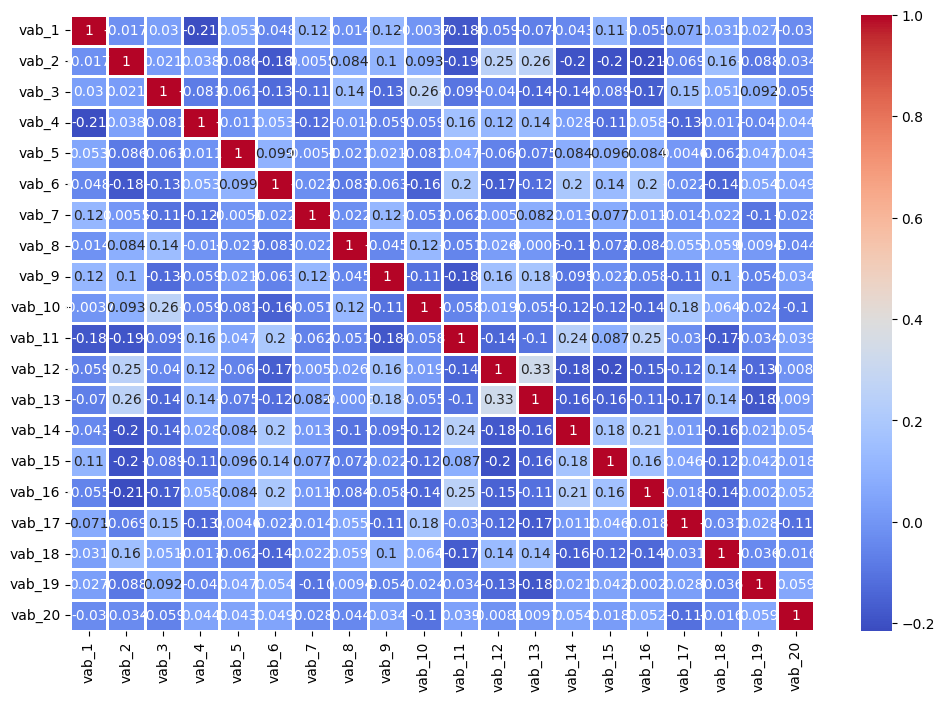

In [3907]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [3908]:
X_values = corr_dataset.iloc[:,:-1].values

In [3909]:
y_values = corr_dataset.iloc[:,-1].values

In [3910]:
scaler = StandardScaler()

In [3911]:
X_values = scaler.fit_transform(X_values)

In [3912]:
np.mean(X_values),np.std(X_values)

(1.9184653865522706e-17, 0.9999999999999996)

In [3913]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.852748,-0.358859,1.115961,-0.288677,-0.662509,-0.548978,-0.658686,-1.222624,1.276647,1.335030,-0.909046,1.548091,0.206337,-1.664466,-0.863285,-1.788581,0.231753,-0.278186,-1.234405,-3.610055
1,-0.443976,0.927871,1.583575,-1.330474,0.656875,-1.086941,-0.527511,0.359873,-0.034206,-1.515945,-0.170430,1.319084,1.150106,-0.434185,-1.062762,-2.060267,0.059930,0.674194,0.175779,0.477769
2,-0.284257,0.412916,-0.577482,0.156825,1.074917,-1.568540,0.450812,1.045854,-1.311659,0.865477,-0.851604,0.511411,1.877338,-0.021970,-1.592051,-0.160308,-1.139113,-0.347266,0.315455,1.272996
3,-1.496056,0.209684,1.448678,-0.497351,-0.317603,-0.821940,0.839367,0.778291,-0.288322,-0.248420,0.949373,0.547857,0.372732,-0.318991,-0.046390,-1.922215,-0.262222,-0.585275,-0.152845,1.244987
4,0.942652,1.271729,-0.556481,0.437442,-0.761158,0.252937,-0.935985,-0.314707,0.341115,1.338238,0.059777,1.746307,1.466090,0.626217,-0.659372,-1.154293,-0.992102,1.697846,0.038112,-0.790775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,1.613742,-0.615451,-1.457243,-1.708146,1.139701,0.787294,1.966669,0.886895,-0.483021,0.511698,0.245163,-0.322556,0.517095,0.250616,2.549084,0.610732,-0.902110,-0.725192,-1.100265,-0.690929
4996,0.901866,-1.542745,1.276771,-2.200757,0.845453,-0.484391,-0.852363,-1.345335,0.259499,-0.271745,0.142809,-0.013148,0.736876,-2.633140,-0.100281,0.495608,-0.336280,-0.831120,-1.458758,-1.370683
4997,-0.501979,2.378188,-0.517579,-0.796699,-1.112513,2.219683,1.543740,0.871514,0.334522,0.389584,-1.611940,-0.419905,1.608603,0.004866,0.801613,-0.231005,-0.447686,-0.334956,-1.050729,-1.980289
4998,1.405283,0.079443,-1.361359,-1.633932,-1.384787,0.898588,1.492522,0.738652,1.440672,0.308491,0.051339,-0.837591,0.276407,0.356003,0.939071,-0.417183,-0.568992,0.735329,-0.517851,-0.190505


<Axes: ylabel='Density'>

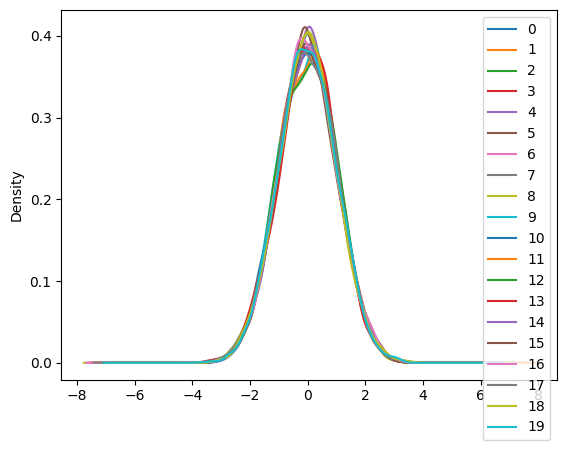

In [3914]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [3915]:
pca_general = PCA()

In [3916]:
pca_general.fit(X_values)

PCA()

In [3917]:
explained_variance = pca_general.explained_variance_ratio_

In [3918]:
explained_variance

array([0.13168693, 0.09532683, 0.07920646, 0.05867684, 0.04867397,
       0.04701905, 0.04509475, 0.04393386, 0.04106307, 0.04092541,
       0.04038963, 0.04009741, 0.03885207, 0.03858104, 0.03775287,
       0.03754836, 0.03547619, 0.03439565, 0.03349595, 0.03180365])

In [3919]:
eigenvalues = pca_general.explained_variance_

In [3920]:
pd.DataFrame(eigenvalues)

,0
0,2.634266
1,1.906918
2,1.584446
3,1.173772
4,0.973674
5,0.940569
6,0.902075
7,0.878853
8,0.821426
9,0.818672


In [3921]:
eigenvectors = pca_general.components_

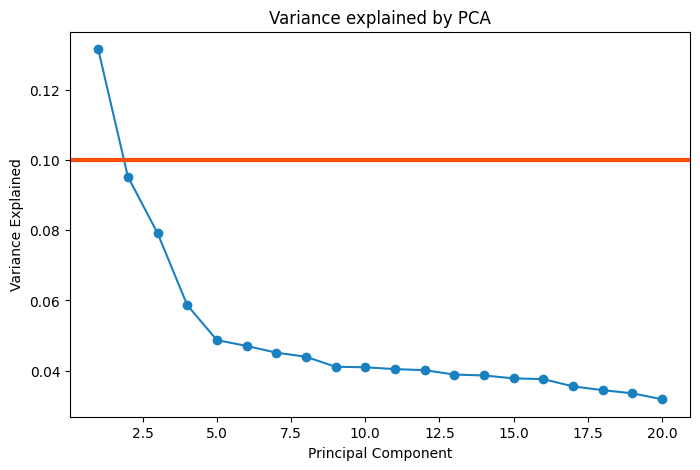

In [3922]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [3923]:
pca = PCA(n_components=2)

In [3924]:
principal_components = pca.fit_transform(X_values)

In [3925]:
pd.DataFrame(principal_components).head(8)

,0,1
0,3.095383,1.337205
1,2.574585,0.160327
2,1.775039,-0.793181
3,1.061534,0.244283
4,2.521170,-1.038773
5,0.388340,-1.052808
6,3.087456,0.605381
7,2.171610,0.918947


In [3926]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2'])

In [3927]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [3928]:
final_df

,principal component 1,principal component 2,target
0,3.095383,1.337205,0
1,2.574585,0.160327,0
2,1.775039,-0.793181,0
3,1.061534,0.244283,0
4,2.521170,-1.038773,0
...,...,...,...
4995,-1.580200,-0.260333,4
4996,0.453275,0.866691,4
4997,1.390629,-0.700173,4
4998,0.100119,-0.265881,4


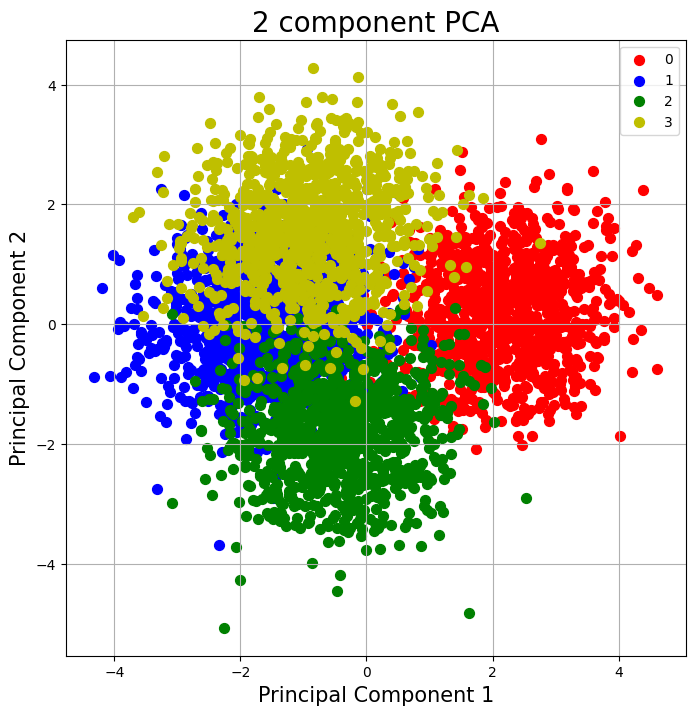

In [3929]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

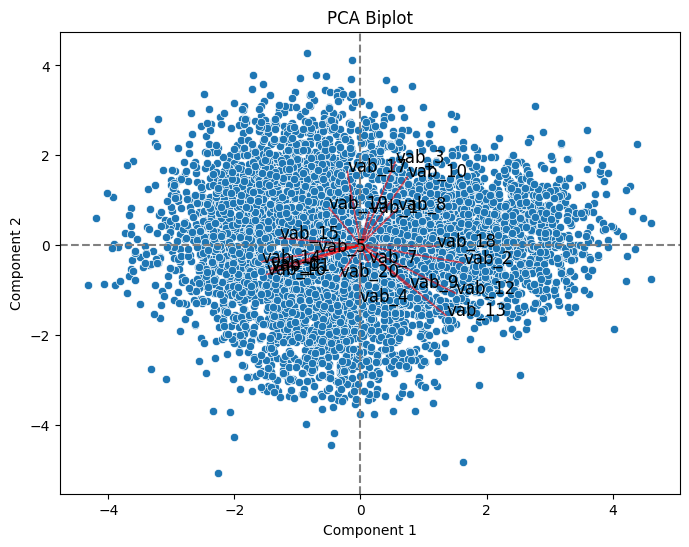

In [3930]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

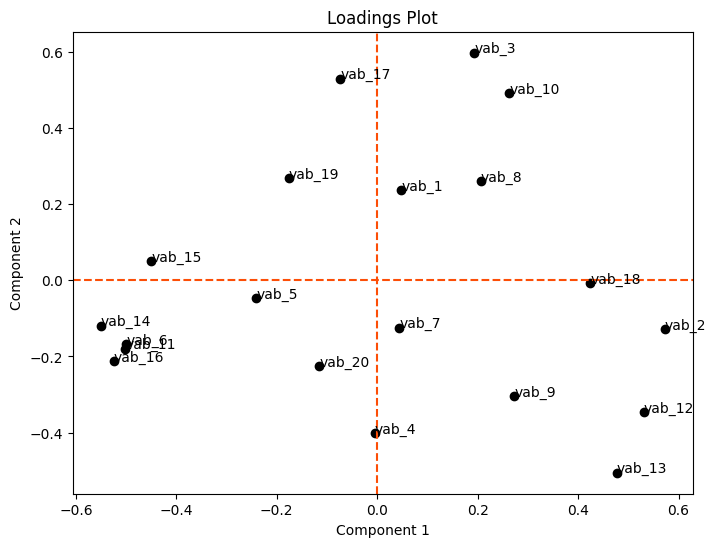

In [3931]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [3932]:
X_pca = pca.transform(X_values)

In [3933]:
pd.DataFrame(X_pca).head()

,0,1
0,3.095383,1.337205
1,2.574585,0.160327
2,1.775039,-0.793181
3,1.061534,0.244283
4,2.521170,-1.038773


## t-SNE

In [3934]:
tsne = TSNE(n_components=2,random_state=42)

In [3935]:
X_tsne = tsne.fit_transform(X_values)

In [3936]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [3937]:
tsne_data

,dim_1,dim_2,target
0,41.305992,20.997316,0
1,47.328583,-0.883313,0
2,38.096638,-12.198227,0
3,39.809673,-4.180035,0
4,42.198006,-16.492023,0
...,...,...,...
4995,6.960654,15.526949,4
4996,21.083982,30.833067,4
4997,6.761449,-0.853568,4
4998,12.948051,14.721420,4


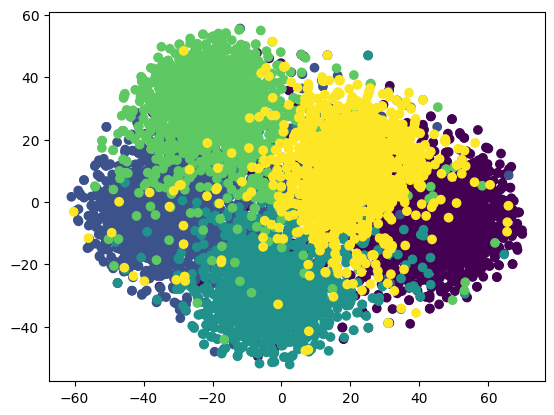

In [3938]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [3939]:
tsne.kl_divergence_

3.032996654510498

## umap

In [3940]:
umap = umap.UMAP(random_state=42)

In [3941]:
X_umap = umap.fit_transform(X_values)

In [3942]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2')),corr_dataset['target']],axis=1)

In [3943]:
umap_data

,dim_1,dim_2,target
0,11.542973,4.962978,0
1,10.907182,5.286990,0
2,10.393479,6.449781,0
3,10.233315,6.670704,0
4,10.934898,6.320686,0
...,...,...,...
4995,7.774396,6.093764,4
4996,7.702282,5.003460,4
4997,8.634010,6.278196,4
4998,8.135983,5.646875,4


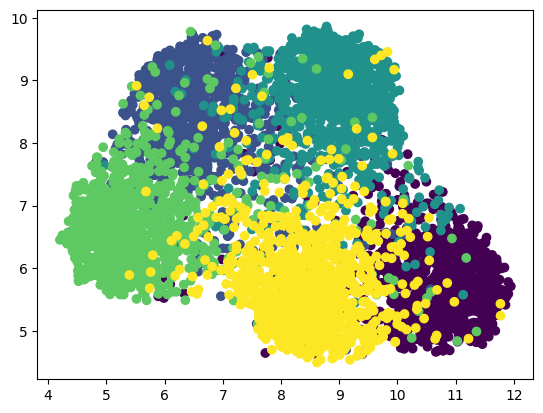

In [3944]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [3945]:
kmeans = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [3946]:
kmeans.fit(X_values)

KMeans(n_clusters=5, random_state=42)

In [3947]:
df_kmeans = corr_dataset.copy()

In [3948]:
df_kmeans['k_means'] = kmeans.labels_

In [3949]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,4
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,4
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,4
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,4
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,3
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,3
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,3
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,3


In [3950]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.0356
accuracy after: 0.8838


In [3951]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


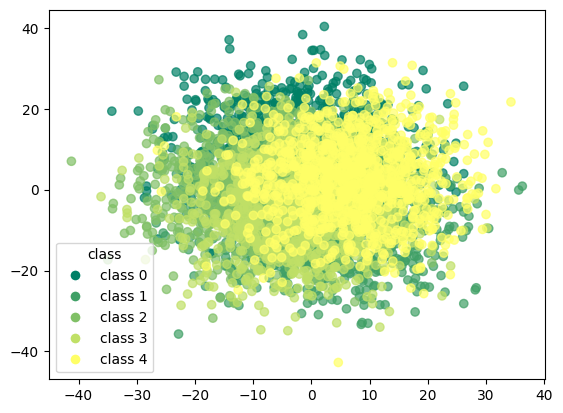

In [3952]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

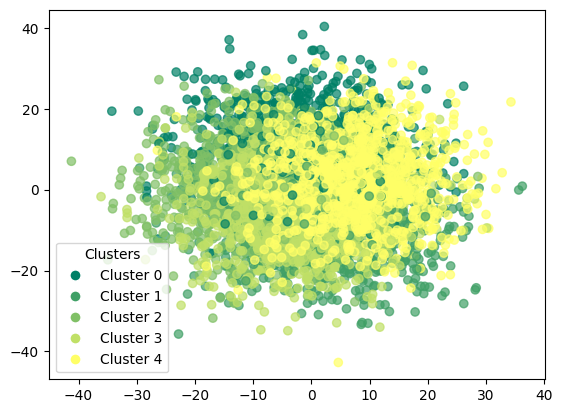

In [3953]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [3954]:
kmeans.cluster_centers_

array([[-1.91723590e-01, -4.26551814e-01,  7.04399308e-01,
        -2.05857377e-01, -7.26521466e-02,  5.65970483e-02,
        -3.11568182e-01,  2.58941543e-01, -8.53234647e-01,
         7.88163307e-01,  4.92112571e-01, -6.01476921e-01,
        -7.98665561e-01,  2.37605822e-01,  1.07143572e-01,
         1.73038722e-01,  7.97591073e-01, -3.17632708e-01,
         1.14923790e-01, -3.42025874e-01],
       [-6.68022516e-01,  2.21267626e-02, -7.40061030e-01,
         7.94191131e-01, -5.40397704e-02,  3.41757861e-01,
         6.78987134e-04, -2.69606850e-01, -1.93565431e-02,
        -4.84456023e-01,  7.70171485e-01,  3.72332099e-01,
         6.45267070e-01,  3.84512599e-01, -1.22295961e-01,
         4.88487390e-01, -5.73408628e-01, -1.59233416e-01,
        -5.19886244e-01,  1.55994676e-01],
       [ 3.24007343e-01, -6.54615379e-01, -2.52201575e-01,
        -1.50192293e-01,  4.47684161e-01,  5.53532791e-01,
        -1.15469839e-01, -3.01775314e-01,  8.72547795e-02,
        -7.11856846e-01,  8.1

In [3955]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[918   3  19  19  41]
 [  7 850  46  53  44]
 [ 23  34 904  15  24]
 [ 15  68  17 881  19]
 [ 60  25  29  20 866]]


In [3956]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.90      0.92      0.91      1000
           1       0.87      0.85      0.86      1000
           2       0.89      0.90      0.90      1000
           3       0.89      0.88      0.89      1000
           4       0.87      0.87      0.87      1000

    accuracy                           0.88      5000
   macro avg       0.88      0.88      0.88      5000
weighted avg       0.88      0.88      0.88      5000



### k-means with pca

In [3957]:
kmeans_pca = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [3958]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=5, random_state=42)

In [3959]:
df_pca_kmeans = corr_dataset.copy()

In [3960]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [3961]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,4
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,4
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,4
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,2
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,0
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,2
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,2
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,2


In [3962]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.242
accuracy after: 0.72


In [3963]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,4
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,1
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


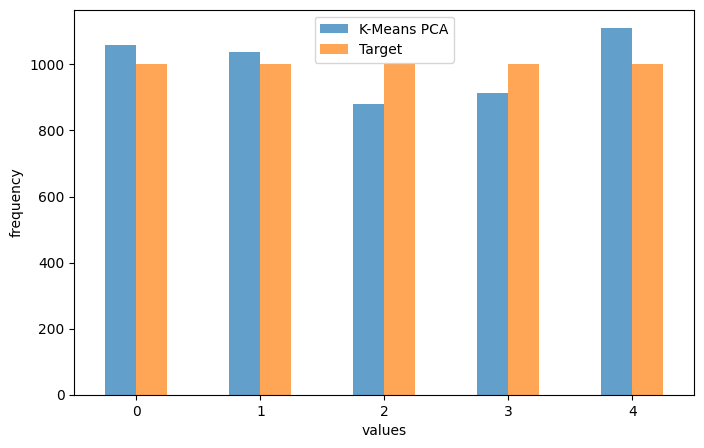

In [3964]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [3965]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[785   1   3  12 199]
 [  0 729  74 105  92]
 [  6  94 753   0 147]
 [ 10 190   1 730  69]
 [258  24  49  66 603]]


In [3966]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.74      0.79      0.76      1000
           1       0.70      0.73      0.72      1000
           2       0.86      0.75      0.80      1000
           3       0.80      0.73      0.76      1000
           4       0.54      0.60      0.57      1000

    accuracy                           0.72      5000
   macro avg       0.73      0.72      0.72      5000
weighted avg       0.73      0.72      0.72      5000



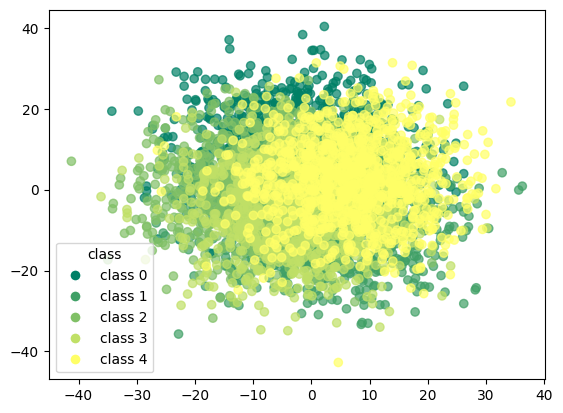

In [3967]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

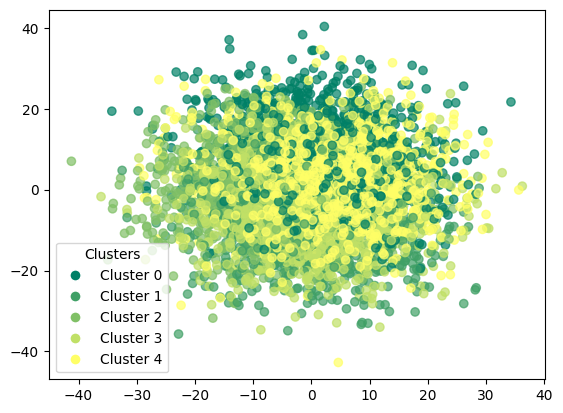

In [3968]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

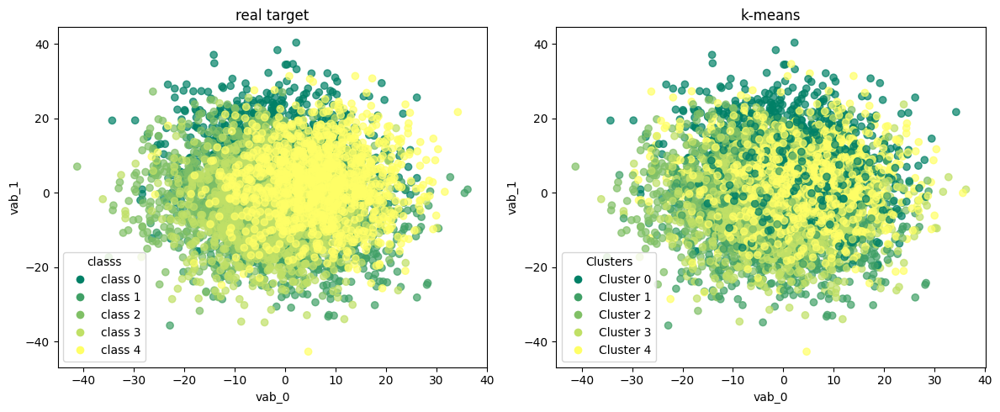

In [3969]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

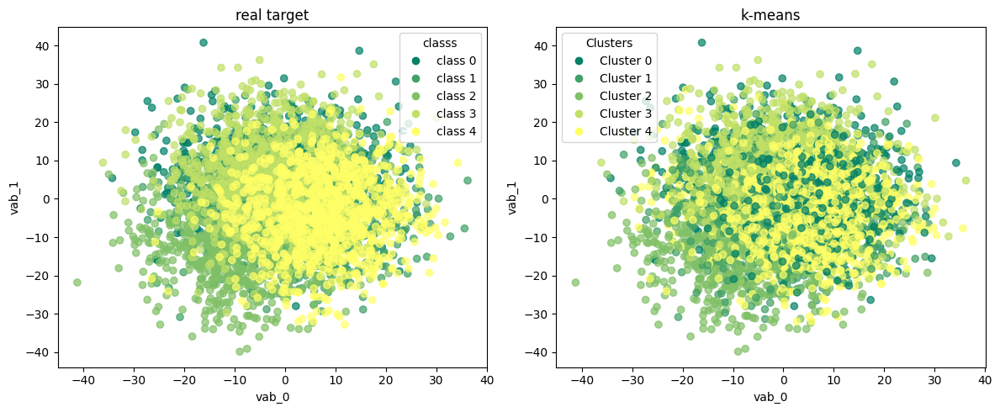

In [3970]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

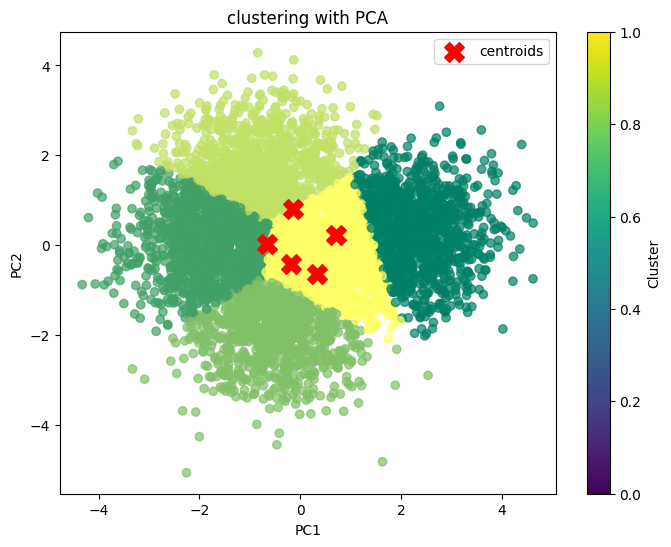

In [3971]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

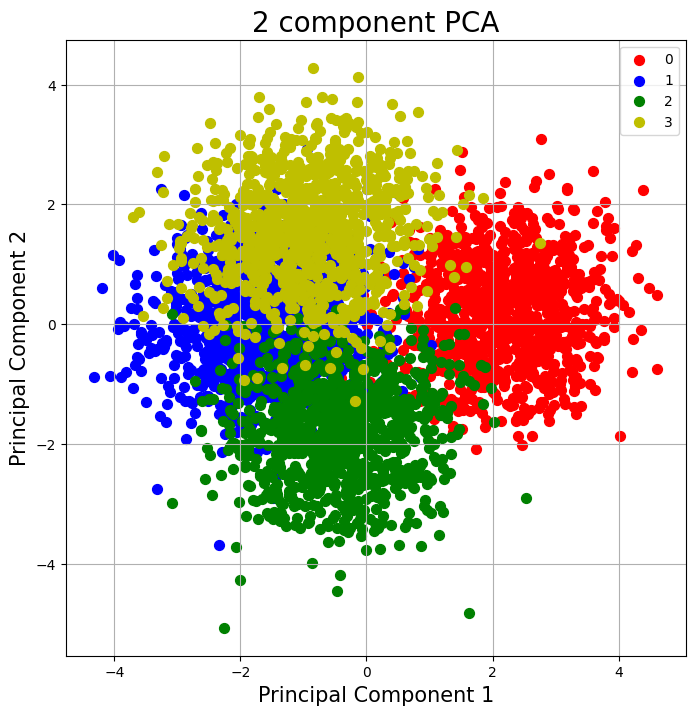

In [3972]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [3973]:
kmeans_tsne = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [3974]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=5, random_state=42)

In [3975]:
df_tsne_kmeans = corr_dataset.copy()

In [3976]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [3977]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,1
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,4
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,4
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,4
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,1
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,1
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,1
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,1


In [3978]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.368
accuracy after: 0.8296


In [3979]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,4
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


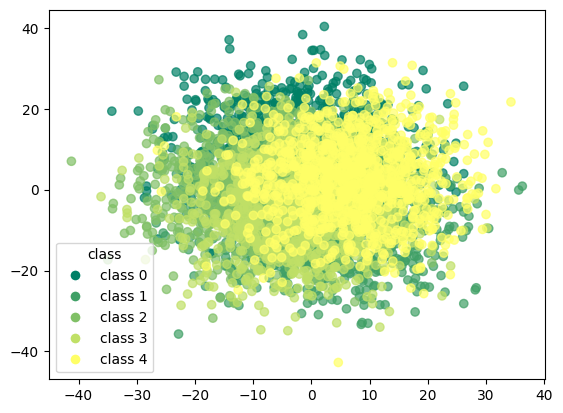

In [3980]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

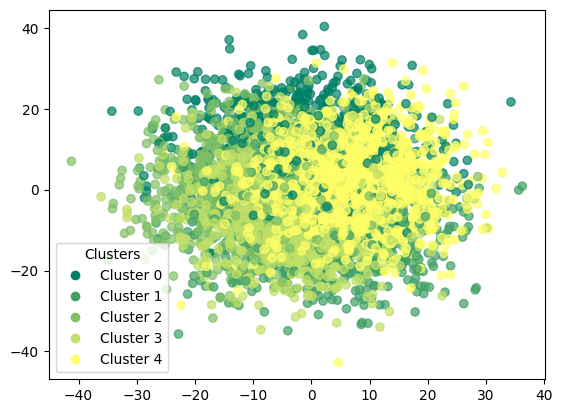

In [3981]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

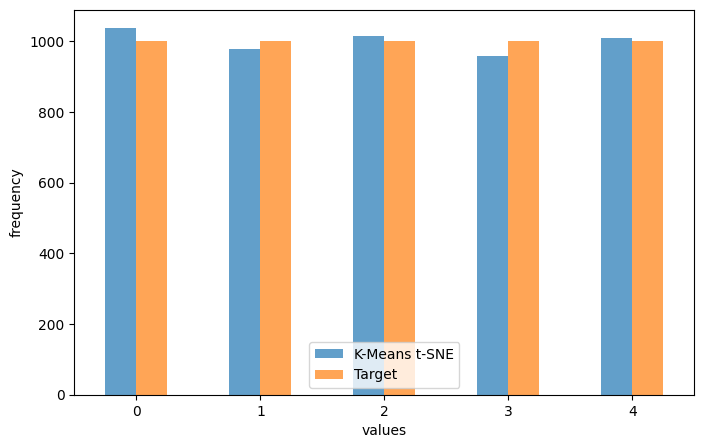

In [3982]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [3983]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[884   8  34  13  61]
 [  7 797  65  74  57]
 [ 32  62 842  17  47]
 [ 12  87  19 831  51]
 [102  25  55  24 794]]


In [3984]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.85      0.88      0.87      1000
           1       0.81      0.80      0.81      1000
           2       0.83      0.84      0.84      1000
           3       0.87      0.83      0.85      1000
           4       0.79      0.79      0.79      1000

    accuracy                           0.83      5000
   macro avg       0.83      0.83      0.83      5000
weighted avg       0.83      0.83      0.83      5000



### k-means with umap

In [3985]:
kmeans_umap = KMeans(n_clusters=5,init='k-means++',random_state=42)

In [3986]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=5, random_state=42)

In [3987]:
df_umap_kmeans = corr_dataset.copy()

In [3988]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [3989]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,2
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,2
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,2
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,2
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,1
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,1
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,1
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,1


In [3990]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.195
accuracy after: 0.8498


In [3991]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


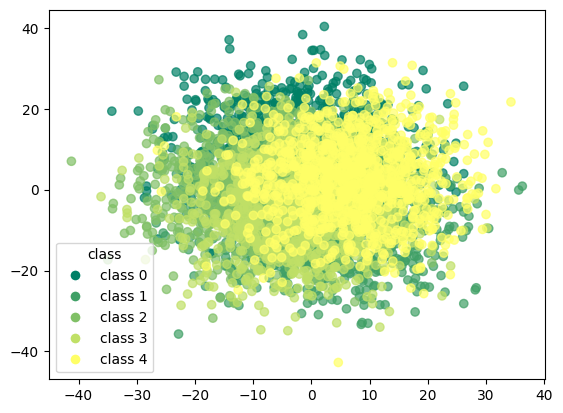

In [3992]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

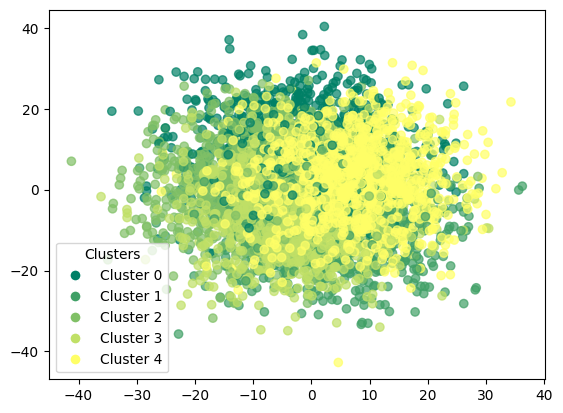

In [3993]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

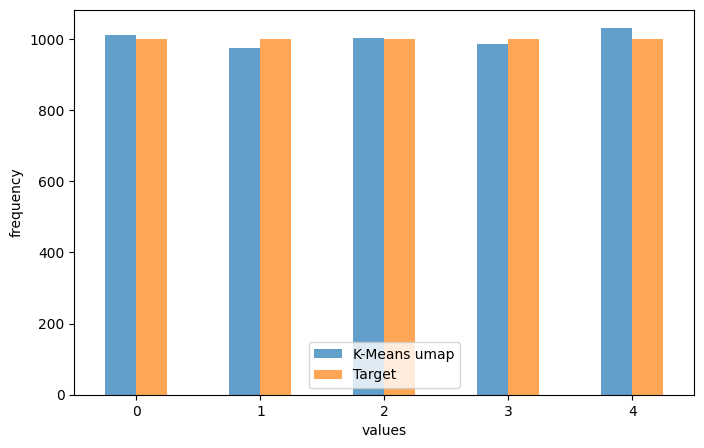

In [3994]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [3995]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[888   8  28  15  61]
 [  7 804  60  77  52]
 [ 32  52 864  12  40]
 [ 15  81  18 851  35]
 [ 68  29  32  29 842]]


In [3996]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.88      0.89      0.88      1000
           1       0.83      0.80      0.81      1000
           2       0.86      0.86      0.86      1000
           3       0.86      0.85      0.86      1000
           4       0.82      0.84      0.83      1000

    accuracy                           0.85      5000
   macro avg       0.85      0.85      0.85      5000
weighted avg       0.85      0.85      0.85      5000



## trimmed k-means

In [3997]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [3998]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=5,trim_fraction=0.1)

In [3999]:
trimmed_kmeans

KMeans(n_clusters=5, random_state=42)

In [4000]:
df_trim_kmeans = corr_dataset.copy()

In [4001]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [4002]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [4003]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,2
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,2
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,2
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,2
5,5.116651,-4.568321,-6.623998,5.126828,2.373341,-10.438317,-11.065071,15.457275,11.185562,-15.910988,...,-1.104295,-10.446492,-18.057734,19.083375,-15.243132,-13.248818,-1.576204,-17.400177,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4992,0.930174,7.192228,-6.814550,-17.383666,-12.254773,-5.649843,8.359624,1.281380,13.843207,-5.048661,...,19.551885,9.573601,0.600830,-1.388032,-7.137066,0.084076,-7.607941,-9.378517,4,3
4993,-2.538859,7.094366,18.053011,-17.825053,-5.839838,-7.823369,-5.173063,-9.829720,8.943605,9.246823,...,25.887746,20.673077,0.273742,13.781377,-12.736563,-4.974612,-14.478081,-13.783642,4,3
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,3
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,3


In [4004]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.026
accuracy after: 0.8884444444444445


In [4005]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
5,5.116651,-4.568321,-6.623998,5.126828,2.373341,-10.438317,-11.065071,15.457275,11.185562,-15.910988,...,-1.104295,-10.446492,-18.057734,19.083375,-15.243132,-13.248818,-1.576204,-17.400177,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4992,0.930174,7.192228,-6.814550,-17.383666,-12.254773,-5.649843,8.359624,1.281380,13.843207,-5.048661,...,19.551885,9.573601,0.600830,-1.388032,-7.137066,0.084076,-7.607941,-9.378517,4,4
4993,-2.538859,7.094366,18.053011,-17.825053,-5.839838,-7.823369,-5.173063,-9.829720,8.943605,9.246823,...,25.887746,20.673077,0.273742,13.781377,-12.736563,-4.974612,-14.478081,-13.783642,4,4
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


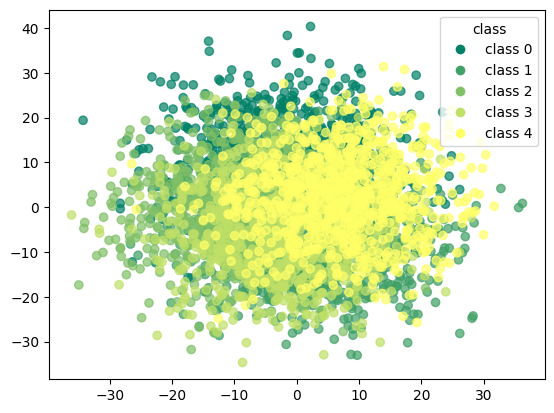

In [4006]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

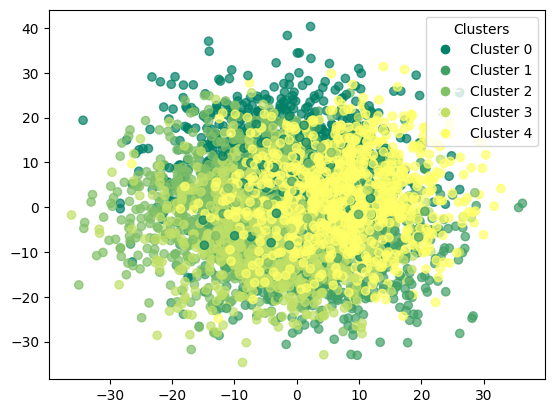

In [4007]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4008]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[825   3  13  11  34]
 [  6 772  40  47  38]
 [ 22  27 823  13  24]
 [ 13  61  13 799  17]
 [ 55  23  28  14 779]]


In [4009]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.90      0.93      0.91       886
           1       0.87      0.85      0.86       903
           2       0.90      0.91      0.90       909
           3       0.90      0.88      0.89       903
           4       0.87      0.87      0.87       899

    accuracy                           0.89      4500
   macro avg       0.89      0.89      0.89      4500
weighted avg       0.89      0.89      0.89      4500



### trimmed k-means with pca

In [4010]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=5,trim_fraction=0.1)

In [4011]:
trim_kmeans_pca

KMeans(n_clusters=5, random_state=42)

In [4012]:
df_pca_trim_kmeans = corr_dataset.copy()

In [4013]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [4014]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [4015]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,1
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,1
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,1
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,3
5,5.116651,-4.568321,-6.623998,5.126828,2.373341,-10.438317,-11.065071,15.457275,11.185562,-15.910988,...,-1.104295,-10.446492,-18.057734,19.083375,-15.243132,-13.248818,-1.576204,-17.400177,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4992,0.930174,7.192228,-6.814550,-17.383666,-12.254773,-5.649843,8.359624,1.281380,13.843207,-5.048661,...,19.551885,9.573601,0.600830,-1.388032,-7.137066,0.084076,-7.607941,-9.378517,4,2
4993,-2.538859,7.094366,18.053011,-17.825053,-5.839838,-7.823369,-5.173063,-9.829720,8.943605,9.246823,...,25.887746,20.673077,0.273742,13.781377,-12.736563,-4.974612,-14.478081,-13.783642,4,3
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,3
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,3


In [4016]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.05
accuracy after: 0.698


In [4017]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,4
5,5.116651,-4.568321,-6.623998,5.126828,2.373341,-10.438317,-11.065071,15.457275,11.185562,-15.910988,...,-1.104295,-10.446492,-18.057734,19.083375,-15.243132,-13.248818,-1.576204,-17.400177,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4992,0.930174,7.192228,-6.814550,-17.383666,-12.254773,-5.649843,8.359624,1.281380,13.843207,-5.048661,...,19.551885,9.573601,0.600830,-1.388032,-7.137066,0.084076,-7.607941,-9.378517,4,1
4993,-2.538859,7.094366,18.053011,-17.825053,-5.839838,-7.823369,-5.173063,-9.829720,8.943605,9.246823,...,25.887746,20.673077,0.273742,13.781377,-12.736563,-4.974612,-14.478081,-13.783642,4,4
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


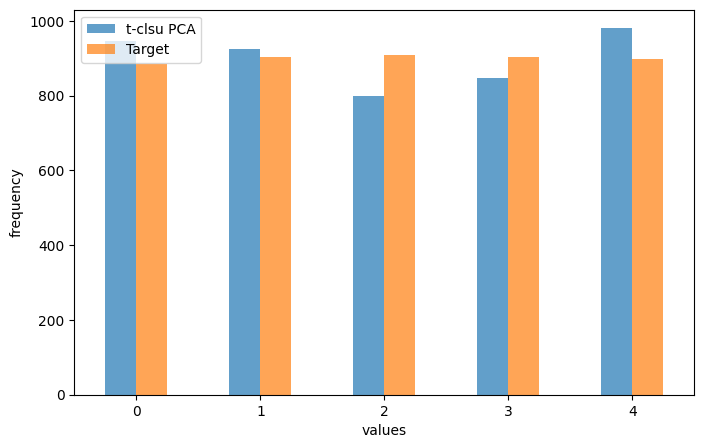

In [4018]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [4019]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[679  31   3  12 161]
 [  0 624  82 116  81]
 [  7  87 665  19 131]
 [ 19 158   3 644  79]
 [242  26  46  56 529]]


In [4020]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.72      0.77      0.74       886
           1       0.67      0.69      0.68       903
           2       0.83      0.73      0.78       909
           3       0.76      0.71      0.74       903
           4       0.54      0.59      0.56       899

    accuracy                           0.70      4500
   macro avg       0.70      0.70      0.70      4500
weighted avg       0.70      0.70      0.70      4500



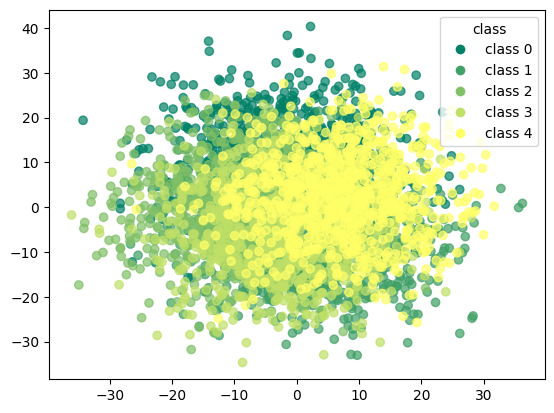

In [4021]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

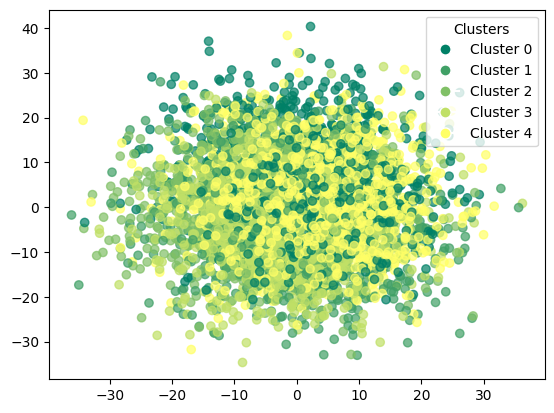

In [4022]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

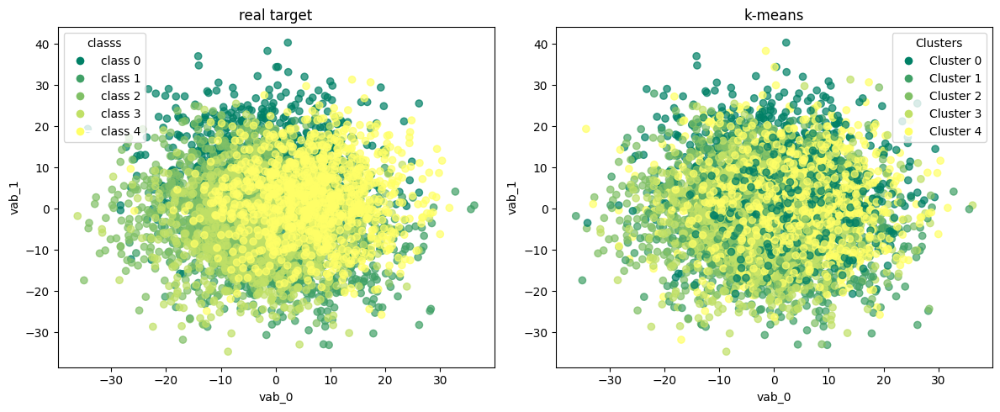

In [4023]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

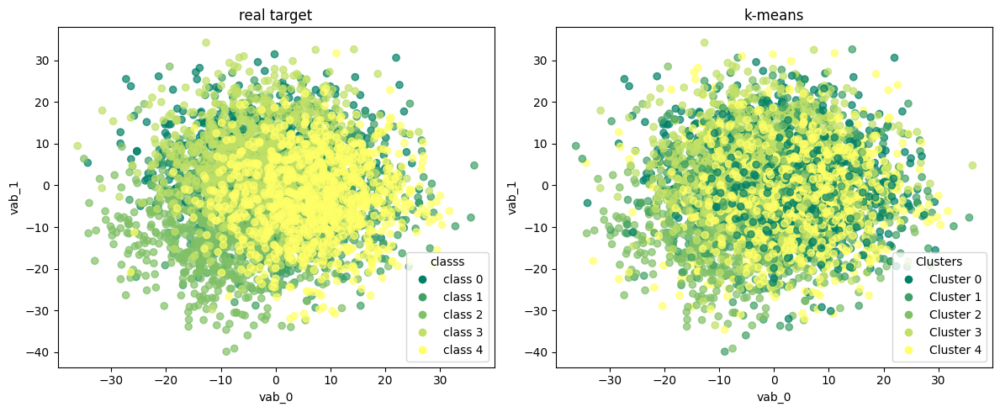

In [4024]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [4025]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=5,trim_fraction=0.1)

In [4026]:
trim_kmeans_tsne

KMeans(n_clusters=5, random_state=42)

In [4027]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [4028]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [4029]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [4030]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,2
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,2
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,2
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,2
5,5.116651,-4.568321,-6.623998,5.126828,2.373341,-10.438317,-11.065071,15.457275,11.185562,-15.910988,...,-1.104295,-10.446492,-18.057734,19.083375,-15.243132,-13.248818,-1.576204,-17.400177,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4992,0.930174,7.192228,-6.814550,-17.383666,-12.254773,-5.649843,8.359624,1.281380,13.843207,-5.048661,...,19.551885,9.573601,0.600830,-1.388032,-7.137066,0.084076,-7.607941,-9.378517,4,1
4993,-2.538859,7.094366,18.053011,-17.825053,-5.839838,-7.823369,-5.173063,-9.829720,8.943605,9.246823,...,25.887746,20.673077,0.273742,13.781377,-12.736563,-4.974612,-14.478081,-13.783642,4,1
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,1
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,1


In [4031]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.025555555555555557
accuracy after: 0.8433333333333334


In [4032]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
5,5.116651,-4.568321,-6.623998,5.126828,2.373341,-10.438317,-11.065071,15.457275,11.185562,-15.910988,...,-1.104295,-10.446492,-18.057734,19.083375,-15.243132,-13.248818,-1.576204,-17.400177,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4992,0.930174,7.192228,-6.814550,-17.383666,-12.254773,-5.649843,8.359624,1.281380,13.843207,-5.048661,...,19.551885,9.573601,0.600830,-1.388032,-7.137066,0.084076,-7.607941,-9.378517,4,4
4993,-2.538859,7.094366,18.053011,-17.825053,-5.839838,-7.823369,-5.173063,-9.829720,8.943605,9.246823,...,25.887746,20.673077,0.273742,13.781377,-12.736563,-4.974612,-14.478081,-13.783642,4,4
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


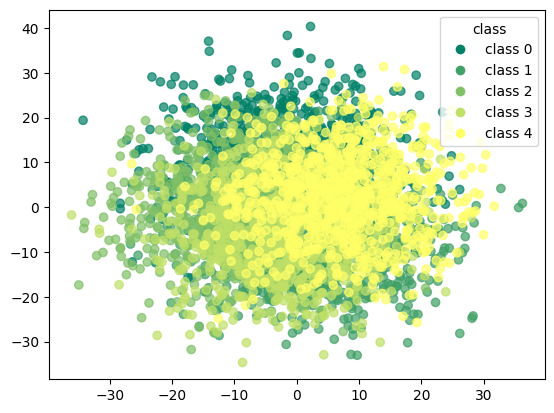

In [4033]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

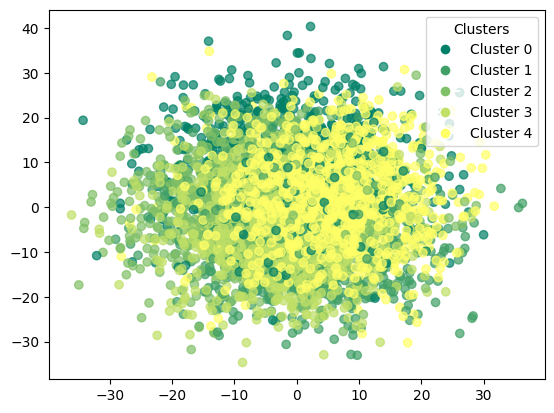

In [4034]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

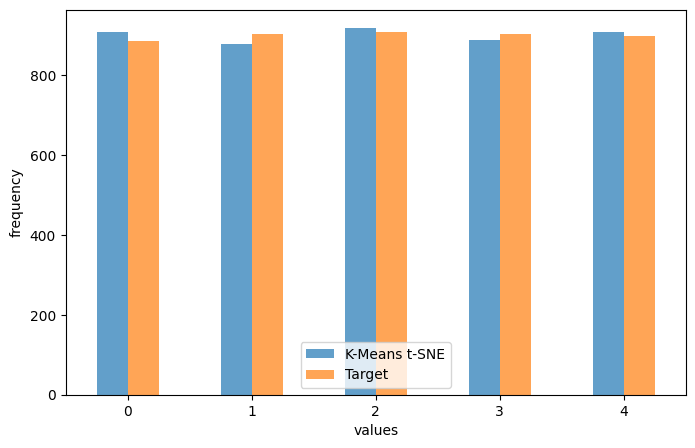

In [4035]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [4036]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[796  18  19   7  46]
 [  3 721  76  59  44]
 [ 23  47 768  39  32]
 [ 11  72  13 766  41]
 [ 75  21  42  17 744]]


In [4037]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.88      0.90      0.89       886
           1       0.82      0.80      0.81       903
           2       0.84      0.84      0.84       909
           3       0.86      0.85      0.86       903
           4       0.82      0.83      0.82       899

    accuracy                           0.84      4500
   macro avg       0.84      0.84      0.84      4500
weighted avg       0.84      0.84      0.84      4500



### trimmed k-means with umap

In [4038]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=5,trim_fraction=0.1)

In [4039]:
trim_kmeans_umap

KMeans(n_clusters=5, random_state=42)

In [4040]:
df_umap_trim_kmeans = corr_dataset.copy()

In [4041]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [4042]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [4043]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,2
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,2
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,2
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,2
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,3
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,3
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,3
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,3


In [4044]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.021555555555555557
accuracy after: 0.8888888888888888


In [4045]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


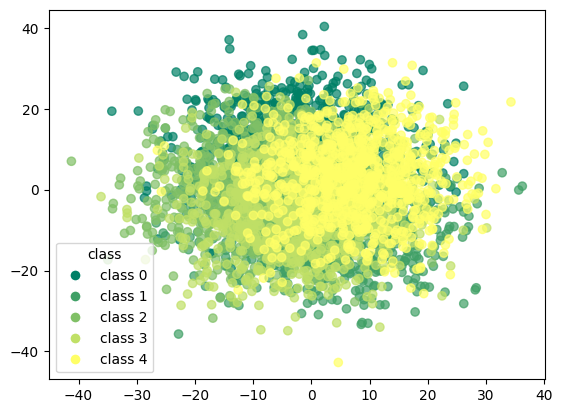

In [4046]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

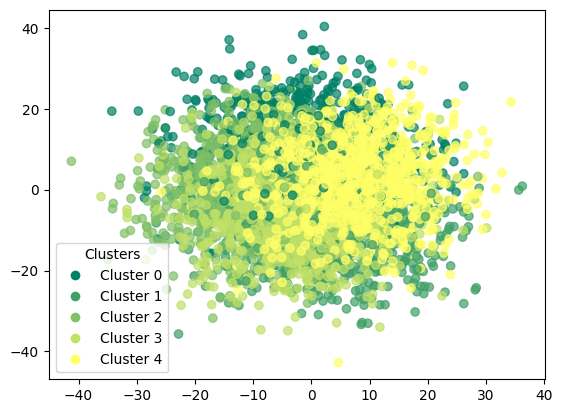

In [4047]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

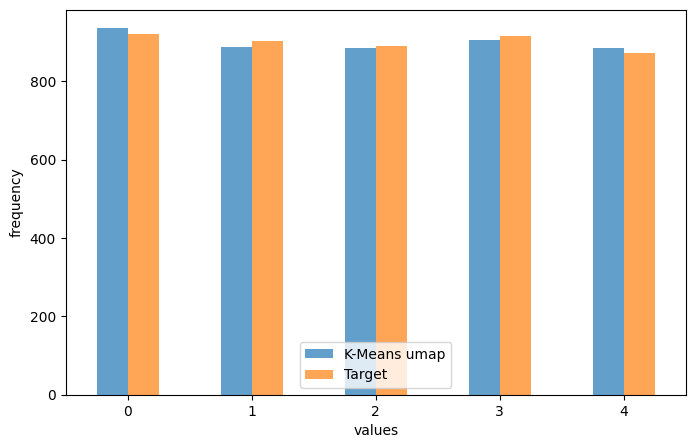

In [4048]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [4049]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[845   7  12  12  44]
 [  6 764  43  59  30]
 [ 20  37 803   6  24]
 [ 13  63   9 816  14]
 [ 52  17  19  13 772]]


In [4050]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.90      0.92      0.91       920
           1       0.86      0.85      0.85       902
           2       0.91      0.90      0.90       890
           3       0.90      0.89      0.90       915
           4       0.87      0.88      0.88       873

    accuracy                           0.89      4500
   macro avg       0.89      0.89      0.89      4500
weighted avg       0.89      0.89      0.89      4500



## dbscan

In [4051]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

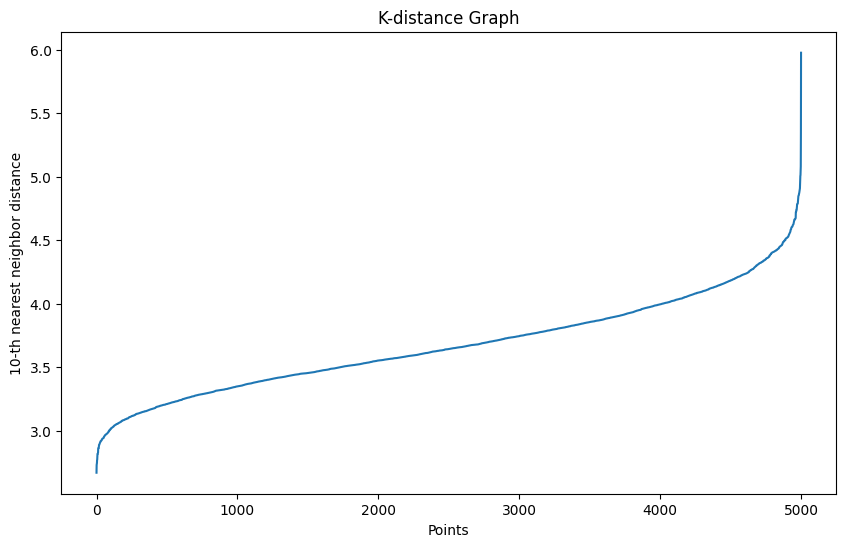

In [4052]:
plot_k_distance_graph(X_values,k=10) 

In [4053]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [4054]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [4055]:
df_dbscan = corr_dataset.copy()

In [4056]:
df_dbscan['dbscan'] = dbscan.labels_

In [4057]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [4058]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,-1
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,-1
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,-1
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,-1
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,-1
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,-1
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,-1
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,-1


In [4059]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    5000
Name: count, dtype: int64


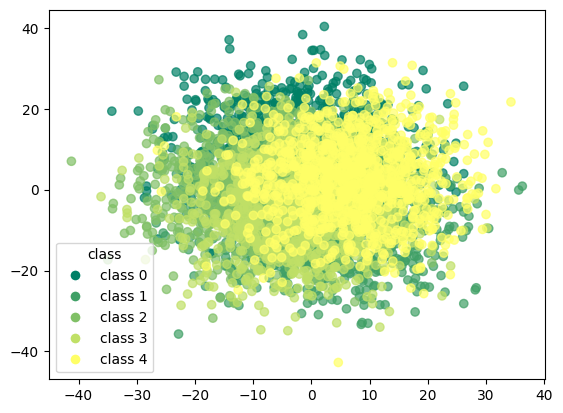

In [4060]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

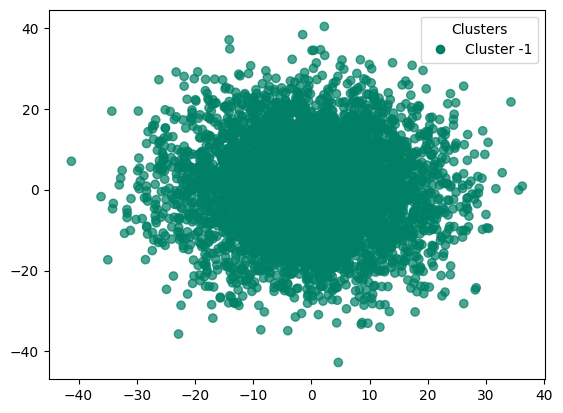

In [4061]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4062]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]]


In [4063]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1000.0
           1       0.00      0.00      0.00    1000.0
           2       0.00      0.00      0.00    1000.0
           3       0.00      0.00      0.00    1000.0
           4       0.00      0.00      0.00    1000.0

    accuracy                           0.00    5000.0
   macro avg       0.00      0.00      0.00    5000.0
weighted avg       0.00      0.00      0.00    5000.0



### dbscan with pca

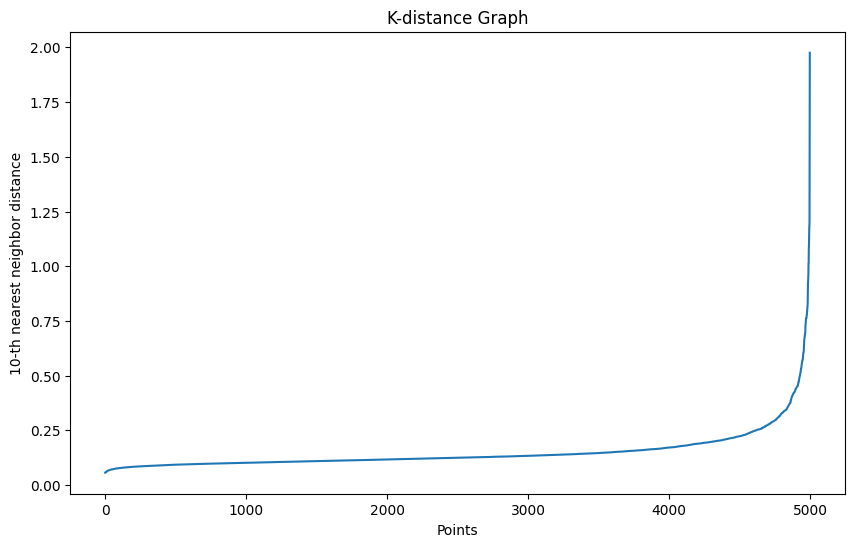

In [4064]:
plot_k_distance_graph(X_pca,k=10)

In [4065]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [4066]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [4067]:
df_pca_dbscan = corr_dataset.copy()

In [4068]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [4069]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.1966
accuracy after: 0.1978


In [4070]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,1
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,1
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,1
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,1
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,1
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,1
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,1
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,1


In [4071]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
 1    4945
-1      55
Name: count, dtype: int64


In [4072]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[  0   0   0   0   0   0]
 [ 17   0 983   0   0   0]
 [ 11   0 989   0   0   0]
 [ 12   0 988   0   0   0]
 [ 13   0 987   0   0   0]
 [  2   0 998   0   0   0]]


In [4073]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1000
           1       0.20      0.99      0.33      1000
           2       0.00      0.00      0.00      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.20      5000
   macro avg       0.03      0.16      0.06      5000
weighted avg       0.04      0.20      0.07      5000



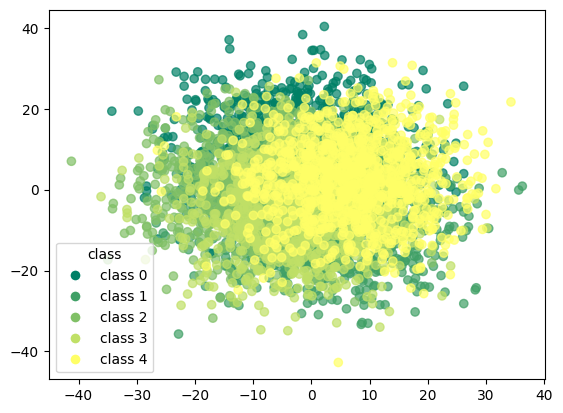

In [4074]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

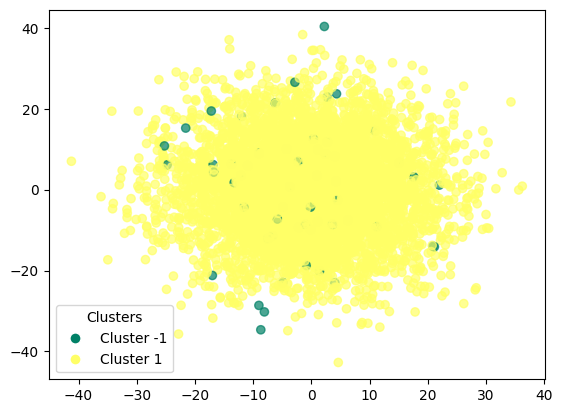

In [4075]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

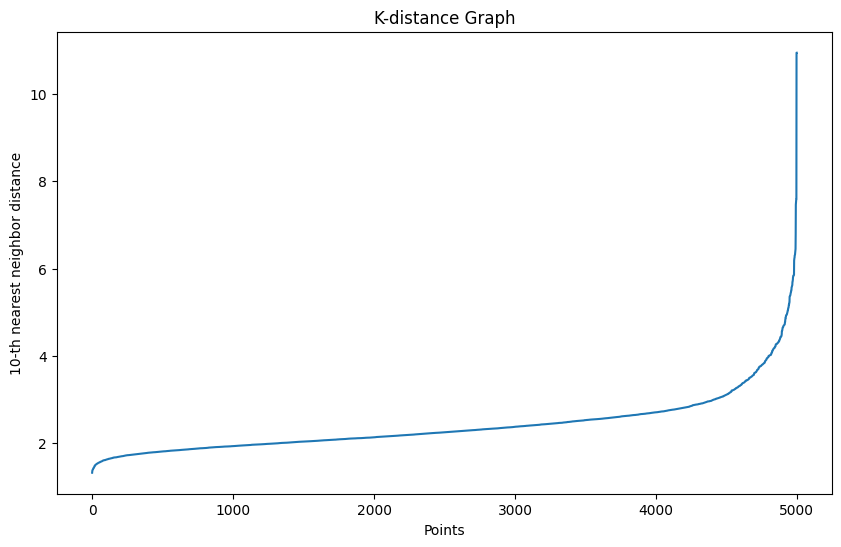

In [4076]:
plot_k_distance_graph(X_tsne,k=10)

In [4077]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [4078]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [4079]:
df_tsne_dbscan = corr_dataset.copy()

In [4080]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [4081]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.1866
accuracy after: 0.186


In [4082]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,1
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,1
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,1
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,1
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,1
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,1
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,1
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,1


In [4083]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
 1    4711
-1     264
 2       9
 4       8
 3       8
Name: count, dtype: int64


In [4084]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[  0   0   0   0   0   0]
 [ 75   0 924   1   0   0]
 [ 62   0 926   0   4   8]
 [ 45   0 955   0   0   0]
 [ 37   0 954   5   4   0]
 [ 45   0 952   3   0   0]]


In [4085]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1000
           1       0.20      0.93      0.32      1000
           2       0.00      0.00      0.00      1000
           3       0.50      0.00      0.01      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.19      5000
   macro avg       0.12      0.15      0.06      5000
weighted avg       0.14      0.19      0.07      5000



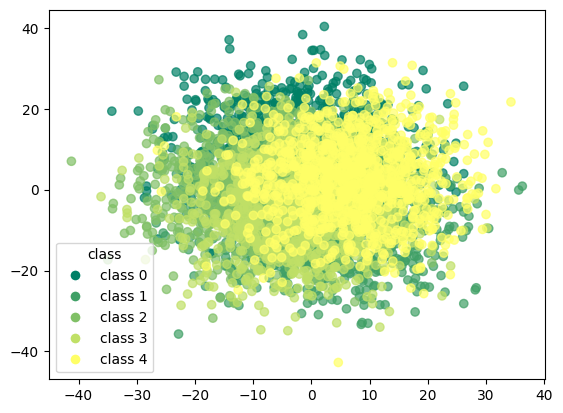

In [4086]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

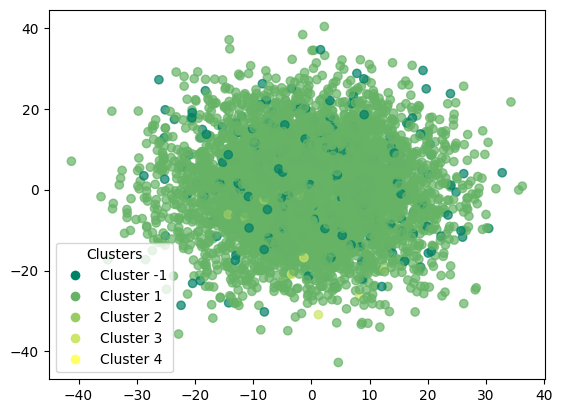

In [4087]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

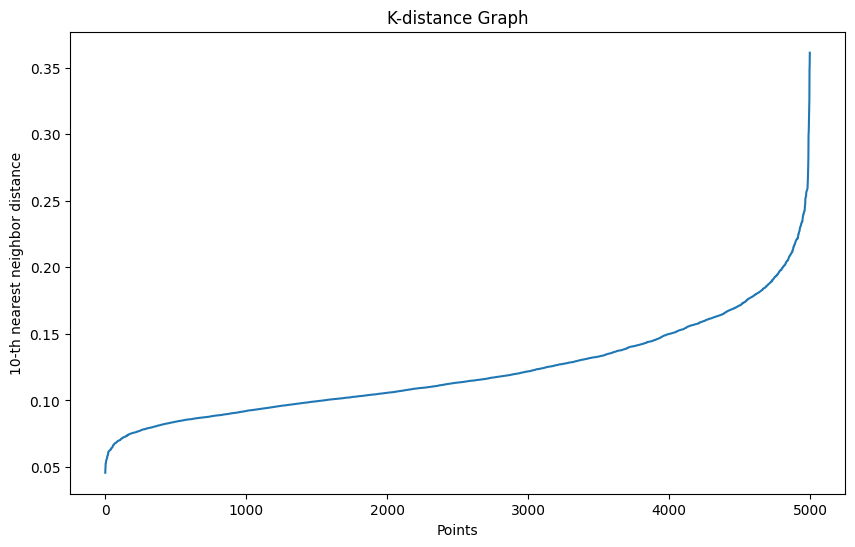

In [4088]:
plot_k_distance_graph(X_umap,k=10)

In [4089]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [4090]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [4091]:
df_umap_dbscan = corr_dataset.copy()

In [4092]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [4093]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 0.2
accuracy after: 0.2


In [4094]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,0
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,0
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,0
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,0


In [4095]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    5000
Name: count, dtype: int64


In [4096]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1000    0    0    0    0]
 [1000    0    0    0    0]
 [1000    0    0    0    0]
 [1000    0    0    0    0]
 [1000    0    0    0    0]]


In [4097]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       0.20      1.00      0.33      1000
           1       0.00      0.00      0.00      1000
           2       0.00      0.00      0.00      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.20      5000
   macro avg       0.04      0.20      0.07      5000
weighted avg       0.04      0.20      0.07      5000



## GMM - Gaussian Mixture Models

In [4098]:
gmm = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [4099]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [4100]:
df_gmm = corr_dataset.copy()

In [4101]:
df_gmm['gmm'] = gmm.predict(X_values)

In [4102]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,4
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,4
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,4
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,4
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,3
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,3


In [4103]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.202
accuracy after: 0.5712


In [4104]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,0
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,0
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,3
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,3


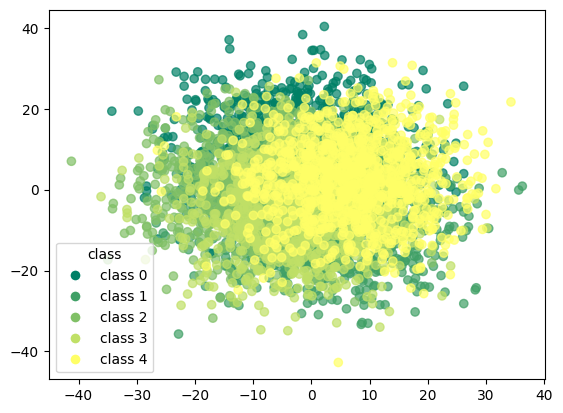

In [4105]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

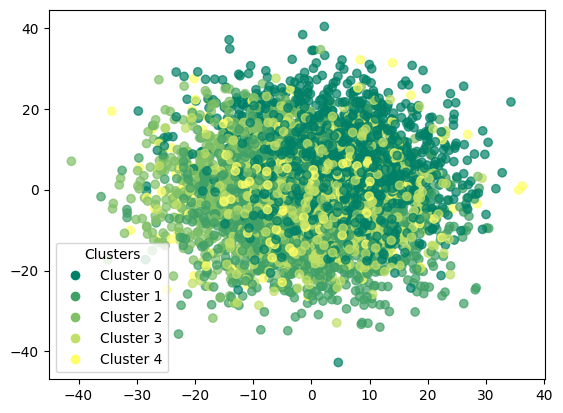

In [4106]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4107]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[861  17  12  19  91]
 [ 22 834  50  31  63]
 [ 49  43 824  17  67]
 [ 30 717  11 236   6]
 [640  28  20 211 101]]


In [4108]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.54      0.86      0.66      1000
           1       0.51      0.83      0.63      1000
           2       0.90      0.82      0.86      1000
           3       0.46      0.24      0.31      1000
           4       0.31      0.10      0.15      1000

    accuracy                           0.57      5000
   macro avg       0.54      0.57      0.52      5000
weighted avg       0.54      0.57      0.52      5000



### GMM with pca

In [4109]:
gmm_pca = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [4110]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [4111]:
df_pca_gmm = corr_dataset.copy()

In [4112]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [4113]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,4
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,2
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,1
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,2
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,0
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,2
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,1
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,1


In [4114]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.1536
accuracy after: 0.5932


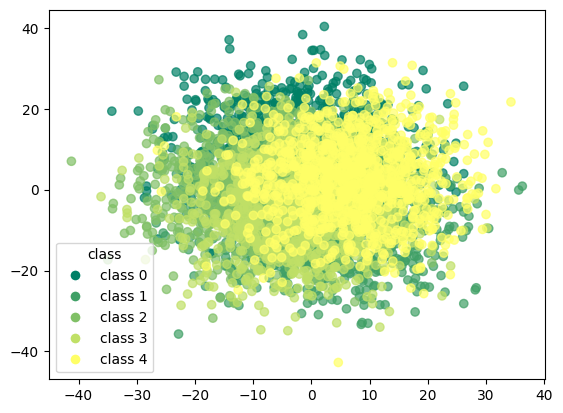

In [4115]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

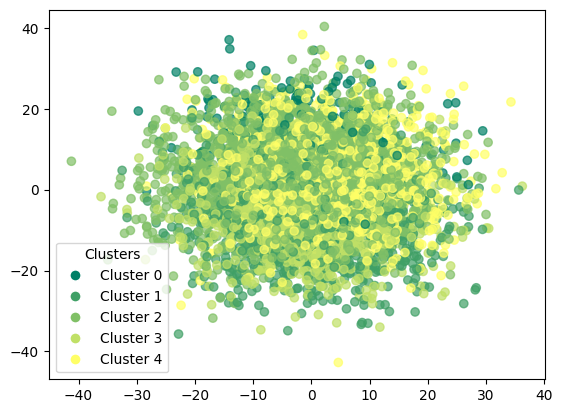

In [4116]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4117]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[267   6 326   5 396]
 [  0 817  65  96  22]
 [  0 166 830   0   4]
 [  1 229   8 670  92]
 [ 23  75 488  32 382]]


In [4118]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.92      0.27      0.41      1000
           1       0.63      0.82      0.71      1000
           2       0.48      0.83      0.61      1000
           3       0.83      0.67      0.74      1000
           4       0.43      0.38      0.40      1000

    accuracy                           0.59      5000
   macro avg       0.66      0.59      0.58      5000
weighted avg       0.66      0.59      0.58      5000



### GMM with t-SNE

In [4119]:
gmm_tsne = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [4120]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [4121]:
df_tsne_gmm = corr_dataset.copy()

In [4122]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [4123]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,4
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,4
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,2
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,4
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,1
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,1
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,1
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,1


In [4124]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.2348
accuracy after: 0.5656


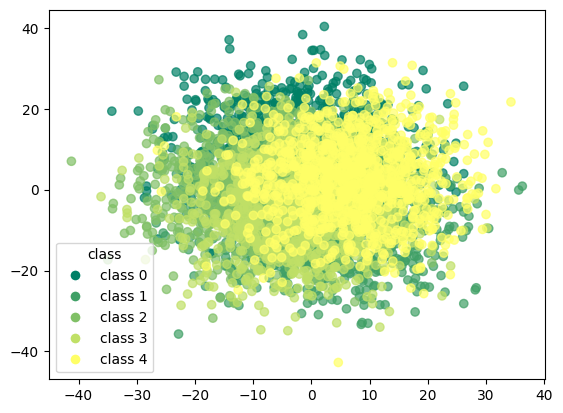

In [4125]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

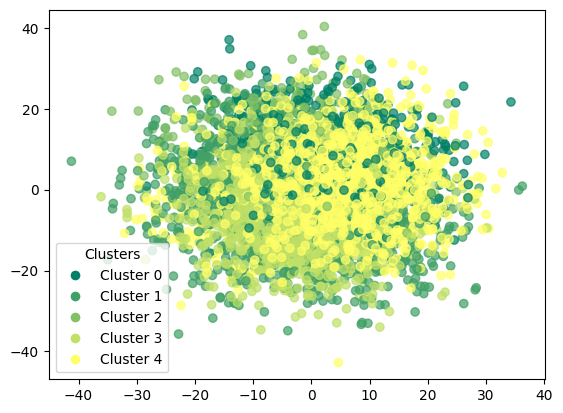

In [4126]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4127]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[458  12 437   8  85]
 [  3 704   6 191  96]
 [  4 661  53  18 264]
 [ 11  41   6 853  89]
 [160  23  33  24 760]]


In [4128]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.72      0.46      0.56      1000
           1       0.49      0.70      0.58      1000
           2       0.10      0.05      0.07      1000
           3       0.78      0.85      0.81      1000
           4       0.59      0.76      0.66      1000

    accuracy                           0.57      5000
   macro avg       0.53      0.57      0.54      5000
weighted avg       0.53      0.57      0.54      5000



### GMM with umap

In [4129]:
gmm_umap = GaussianMixture(n_components=5,init_params='k-means++',random_state=42)

In [4130]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=5, random_state=42)

In [4131]:
df_umap_gmm = corr_dataset.copy()

In [4132]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [4133]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,2
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,2
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,2
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,2
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,1
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,1
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,1
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,1


In [4134]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.1964
accuracy after: 0.8472


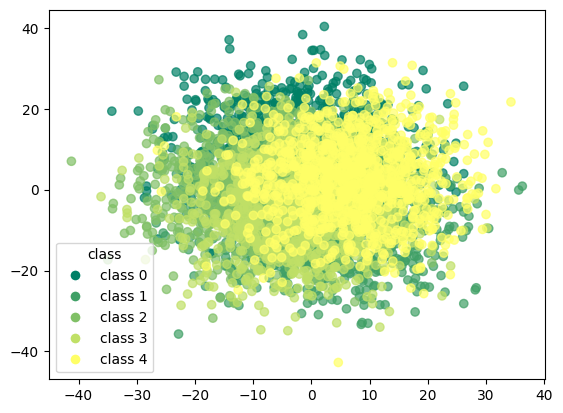

In [4135]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

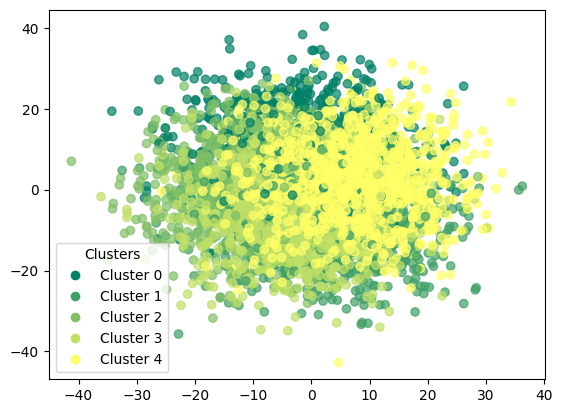

In [4136]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [4137]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[853  11  24  16  96]
 [  7 814  43  72  64]
 [ 31  72 838   8  51]
 [ 13  72  10 851  54]
 [ 48  25  25  22 880]]


In [4138]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.90      0.85      0.87      1000
           1       0.82      0.81      0.82      1000
           2       0.89      0.84      0.86      1000
           3       0.88      0.85      0.86      1000
           4       0.77      0.88      0.82      1000

    accuracy                           0.85      5000
   macro avg       0.85      0.85      0.85      5000
weighted avg       0.85      0.85      0.85      5000



## pam

In [4139]:
initial_medoids = np.random.choice(len(X_values),5,replace=False)

In [4140]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4141]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [4142]:
pam.process()

In [4143]:
clusters = pam.get_clusters()

In [4144]:
medoids = pam.get_medoids()

In [4145]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4146]:
df_pam = corr_dataset.copy()

In [4147]:
df_pam['pam'] = labels

In [4148]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,4.0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,4.0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,4.0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,4.0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,0.0
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,2.0
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,4.0
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,0.0


In [4149]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.0986
accuracy after: 0.6546


In [4150]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,3
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,0
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


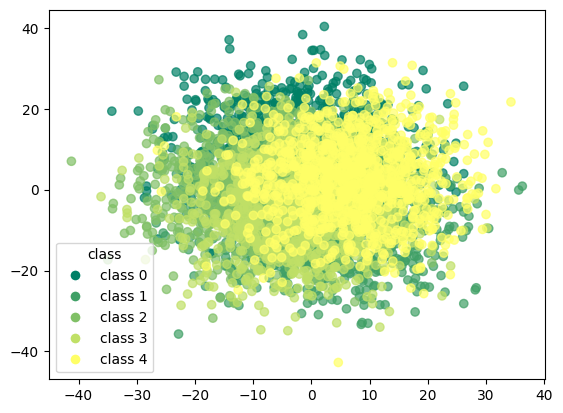

In [4151]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

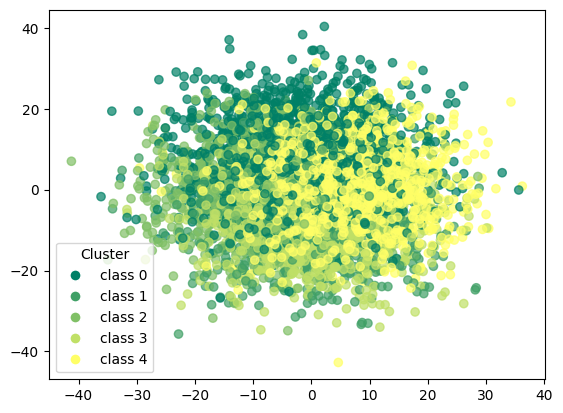

In [4152]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4153]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[938   2  15   7  38]
 [108 513  40 251  88]
 [218 143 587  15  37]
 [241 147  20 578  14]
 [253  15  34  41 657]]


In [4154]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.53      0.94      0.68      1000
           1       0.63      0.51      0.56      1000
           2       0.84      0.59      0.69      1000
           3       0.65      0.58      0.61      1000
           4       0.79      0.66      0.72      1000

    accuracy                           0.65      5000
   macro avg       0.69      0.65      0.65      5000
weighted avg       0.69      0.65      0.65      5000



### pam with pca

In [4155]:
initial_medoids = np.random.choice(len(X_pca),5,replace=False)

In [4156]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4157]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [4158]:
pam_pca.process()

In [4159]:
clusters = pam_pca.get_clusters()

In [4160]:
medoids = pam_pca.get_medoids()

In [4161]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4162]:
df_pam_pca = corr_dataset.copy()

In [4163]:
df_pam_pca['pam_pca'] = labels

In [4164]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,2.0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,2.0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,3.0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,3.0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,0.0
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,3.0
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,3.0
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,3.0


In [4165]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.0464
accuracy after: 0.7192


In [4166]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,4
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,4
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,1
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


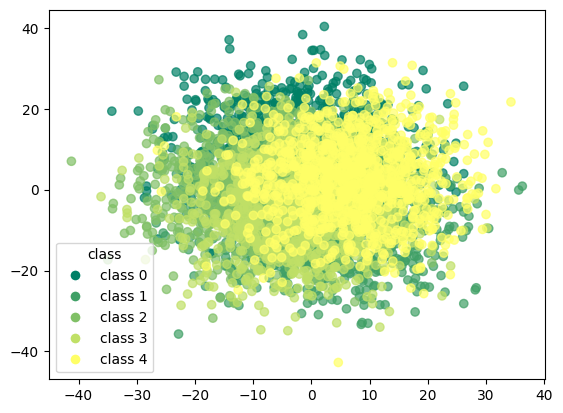

In [4167]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

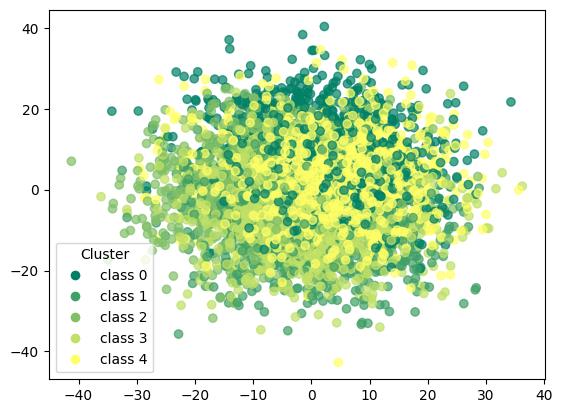

In [4168]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4169]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[783   2   3  14 198]
 [  0 735  81 118  66]
 [  4  93 758   0 145]
 [ 13 191   2 739  55]
 [259  31  53  76 581]]


In [4170]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.74      0.78      0.76      1000
           1       0.70      0.73      0.72      1000
           2       0.85      0.76      0.80      1000
           3       0.78      0.74      0.76      1000
           4       0.56      0.58      0.57      1000

    accuracy                           0.72      5000
   macro avg       0.72      0.72      0.72      5000
weighted avg       0.72      0.72      0.72      5000



### pam with t-SNE

In [4171]:
initial_medoids = np.random.choice(len(X_pca),5,replace=False)

In [4172]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4173]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [4174]:
pam_tsne.process()

In [4175]:
clusters = pam_tsne.get_clusters()

In [4176]:
medoids = pam_tsne.get_medoids()

In [4177]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4178]:
df_pam_tsne = corr_dataset.copy()

In [4179]:
df_pam_tsne['pam_tsne'] = labels

In [4180]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,2.0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,1.0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,1.0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,1.0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,2.0
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,2.0
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,2.0
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,2.0


In [4181]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.1894
accuracy after: 0.8284


In [4182]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,4
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


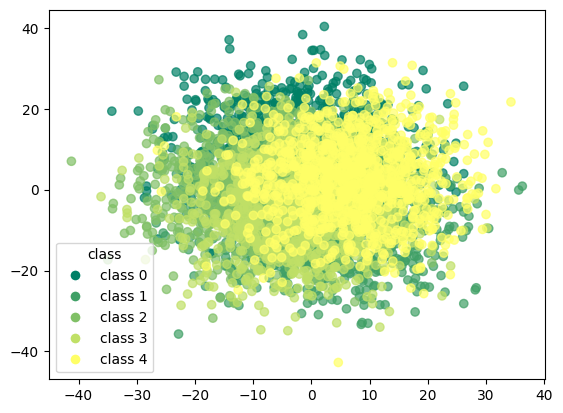

In [4183]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

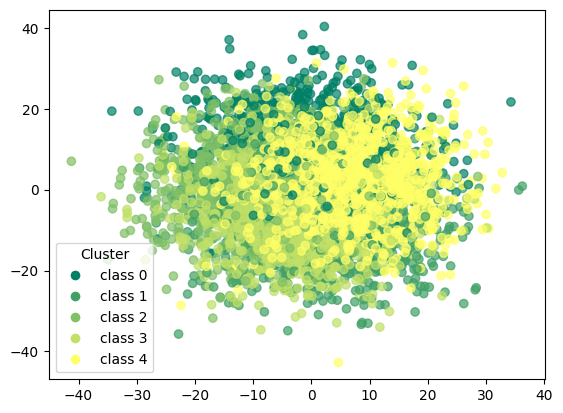

In [4184]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4185]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[880   8  36  13  63]
 [  7 791  65  80  57]
 [ 31  60 844  18  47]
 [ 12  85  20 832  51]
 [100  25  55  25 795]]


In [4186]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.85      0.88      0.87      1000
           1       0.82      0.79      0.80      1000
           2       0.83      0.84      0.84      1000
           3       0.86      0.83      0.85      1000
           4       0.78      0.80      0.79      1000

    accuracy                           0.83      5000
   macro avg       0.83      0.83      0.83      5000
weighted avg       0.83      0.83      0.83      5000



### pam with umap

In [4187]:
initial_medoids = np.random.choice(len(X_pca),5,replace=False)

In [4188]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [4189]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [4190]:
pam_umap.process()

In [4191]:
clusters = pam_umap.get_clusters()

In [4192]:
medoids = pam_umap.get_medoids()

In [4193]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [4194]:
df_pam_umap = corr_dataset.copy()

In [4195]:
df_pam_umap['pam_umap'] = labels

In [4196]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,1.0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,1.0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,1.0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,1.0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,2.0
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,2.0
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,2.0
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,2.0


In [4197]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.0202
accuracy after: 0.8494


In [4198]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,8.992073,-3.963618,11.844936,-4.269366,-10.933055,-6.447935,-11.463876,-9.493864,15.419881,15.703632,...,3.117174,-15.649427,-6.672411,-18.144431,0.640534,-7.828624,-17.471276,-41.427589,0,0
1,-5.439254,10.842577,17.321660,-16.307310,2.557704,-12.468537,-10.005087,7.173299,0.466475,-18.868476,...,15.383583,-1.468735,-8.917245,-21.242061,-1.232680,2.113917,-1.614836,0.028520,0,0
2,-3.661728,4.917074,-7.988753,0.878406,6.832201,-17.858327,0.874769,14.398175,-14.105920,10.009630,...,24.835606,3.282612,-14.873647,0.420320,-14.304646,-8.549796,-0.044281,8.093212,0,0
3,-17.147928,2.578519,15.741740,-6.680594,-7.406373,-9.502786,5.195860,11.580155,-2.432318,-3.497943,...,5.279863,-0.140966,2.520587,-19.668058,-4.744780,-11.034529,-5.309957,7.809154,0,0
4,9.992612,14.799301,-7.742787,4.120927,-11.941749,2.526664,-14.547691,0.068494,4.747906,15.742524,...,19.490504,10.753856,-4.377665,-10.912604,-12.701928,12.800514,-3.162794,-12.836248,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,17.461218,-6.916188,-18.292551,-20.671307,7.494622,8.506898,17.732499,12.723994,-4.653320,5.719566,...,7.156178,6.424530,31.728971,9.211334,-11.720843,-12.495214,-15.962967,-11.823673,4,4
4996,9.538706,-17.586417,13.728356,-26.363426,4.485924,-5.725115,-13.617741,-10.786278,3.816885,-3.780792,...,10.012733,-26.814721,1.914119,7.898743,-5.552168,-13.601074,-19.993951,-18.717300,4,4
4997,-6.084775,27.531148,-7.287158,-10.139551,-15.534364,24.537426,13.029141,12.561990,4.672701,4.238753,...,21.342786,3.591923,12.063665,-0.385734,-6.766709,-8.421282,-15.405981,-24.899536,4,4
4998,15.141268,1.079851,-17.169555,-19.813772,-18.318379,9.752443,12.459544,11.162667,17.290974,3.255389,...,4.027893,7.639266,13.610560,-2.508441,-8.089184,2.752145,-9.414175,-6.748688,4,4


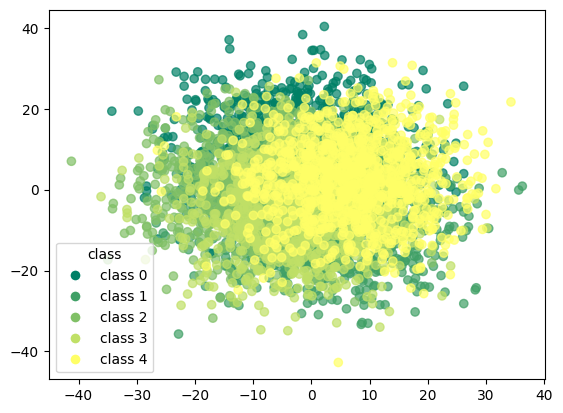

In [4199]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

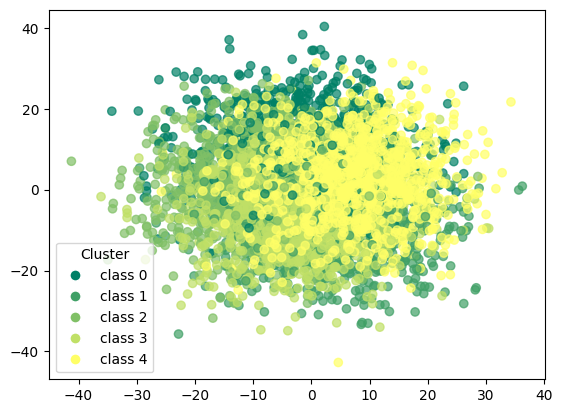

In [4200]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [4201]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[885   9  25  15  66]
 [  7 805  59  77  52]
 [ 35  53 859  12  41]
 [ 15  83  16 851  35]
 [ 66  30  29  28 847]]


In [4202]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.88      0.89      0.88      1000
           1       0.82      0.81      0.81      1000
           2       0.87      0.86      0.86      1000
           3       0.87      0.85      0.86      1000
           4       0.81      0.85      0.83      1000

    accuracy                           0.85      5000
   macro avg       0.85      0.85      0.85      5000
weighted avg       0.85      0.85      0.85      5000



# overall results k-means

## basic

In [4203]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.90      0.92      0.91      1000
           1       0.87      0.85      0.86      1000
           2       0.89      0.90      0.90      1000
           3       0.89      0.88      0.89      1000
           4       0.87      0.87      0.87      1000

    accuracy                           0.88      5000
   macro avg       0.88      0.88      0.88      5000
weighted avg       0.88      0.88      0.88      5000



In [4204]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[918   3  19  19  41]
 [  7 850  46  53  44]
 [ 23  34 904  15  24]
 [ 15  68  17 881  19]
 [ 60  25  29  20 866]]


## + pca

In [4205]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.74      0.79      0.76      1000
           1       0.70      0.73      0.72      1000
           2       0.86      0.75      0.80      1000
           3       0.80      0.73      0.76      1000
           4       0.54      0.60      0.57      1000

    accuracy                           0.72      5000
   macro avg       0.73      0.72      0.72      5000
weighted avg       0.73      0.72      0.72      5000



In [4206]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[785   1   3  12 199]
 [  0 729  74 105  92]
 [  6  94 753   0 147]
 [ 10 190   1 730  69]
 [258  24  49  66 603]]


## + t-SNE

In [4207]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.85      0.88      0.87      1000
           1       0.81      0.80      0.81      1000
           2       0.83      0.84      0.84      1000
           3       0.87      0.83      0.85      1000
           4       0.79      0.79      0.79      1000

    accuracy                           0.83      5000
   macro avg       0.83      0.83      0.83      5000
weighted avg       0.83      0.83      0.83      5000



In [4208]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[884   8  34  13  61]
 [  7 797  65  74  57]
 [ 32  62 842  17  47]
 [ 12  87  19 831  51]
 [102  25  55  24 794]]


## + UMAP

In [4209]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.88      0.89      0.88      1000
           1       0.83      0.80      0.81      1000
           2       0.86      0.86      0.86      1000
           3       0.86      0.85      0.86      1000
           4       0.82      0.84      0.83      1000

    accuracy                           0.85      5000
   macro avg       0.85      0.85      0.85      5000
weighted avg       0.85      0.85      0.85      5000



In [4210]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[888   8  28  15  61]
 [  7 804  60  77  52]
 [ 32  52 864  12  40]
 [ 15  81  18 851  35]
 [ 68  29  32  29 842]]


# overall results trimmed k-means

## basic

In [4211]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.90      0.93      0.91       886
           1       0.87      0.85      0.86       903
           2       0.90      0.91      0.90       909
           3       0.90      0.88      0.89       903
           4       0.87      0.87      0.87       899

    accuracy                           0.89      4500
   macro avg       0.89      0.89      0.89      4500
weighted avg       0.89      0.89      0.89      4500



In [4212]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[825   3  13  11  34]
 [  6 772  40  47  38]
 [ 22  27 823  13  24]
 [ 13  61  13 799  17]
 [ 55  23  28  14 779]]


## + pca

In [4213]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.72      0.77      0.74       886
           1       0.67      0.69      0.68       903
           2       0.83      0.73      0.78       909
           3       0.76      0.71      0.74       903
           4       0.54      0.59      0.56       899

    accuracy                           0.70      4500
   macro avg       0.70      0.70      0.70      4500
weighted avg       0.70      0.70      0.70      4500



In [4214]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[679  31   3  12 161]
 [  0 624  82 116  81]
 [  7  87 665  19 131]
 [ 19 158   3 644  79]
 [242  26  46  56 529]]


## + t-SNE

In [4215]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.88      0.90      0.89       886
           1       0.82      0.80      0.81       903
           2       0.84      0.84      0.84       909
           3       0.86      0.85      0.86       903
           4       0.82      0.83      0.82       899

    accuracy                           0.84      4500
   macro avg       0.84      0.84      0.84      4500
weighted avg       0.84      0.84      0.84      4500



In [4216]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[796  18  19   7  46]
 [  3 721  76  59  44]
 [ 23  47 768  39  32]
 [ 11  72  13 766  41]
 [ 75  21  42  17 744]]


## + UMAP

In [4217]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.90      0.92      0.91       920
           1       0.86      0.85      0.85       902
           2       0.91      0.90      0.90       890
           3       0.90      0.89      0.90       915
           4       0.87      0.88      0.88       873

    accuracy                           0.89      4500
   macro avg       0.89      0.89      0.89      4500
weighted avg       0.89      0.89      0.89      4500



In [4218]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[845   7  12  12  44]
 [  6 764  43  59  30]
 [ 20  37 803   6  24]
 [ 13  63   9 816  14]
 [ 52  17  19  13 772]]


# overall results dbscan

## basic

In [4219]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1000.0
           1       0.00      0.00      0.00    1000.0
           2       0.00      0.00      0.00    1000.0
           3       0.00      0.00      0.00    1000.0
           4       0.00      0.00      0.00    1000.0

    accuracy                           0.00    5000.0
   macro avg       0.00      0.00      0.00    5000.0
weighted avg       0.00      0.00      0.00    5000.0



In [4220]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]
 [1000    0    0    0    0    0]]


## + pca

In [4221]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1000
           1       0.20      0.99      0.33      1000
           2       0.00      0.00      0.00      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.20      5000
   macro avg       0.03      0.16      0.06      5000
weighted avg       0.04      0.20      0.07      5000



In [4222]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[  0   0   0   0   0   0]
 [ 17   0 983   0   0   0]
 [ 11   0 989   0   0   0]
 [ 12   0 988   0   0   0]
 [ 13   0 987   0   0   0]
 [  2   0 998   0   0   0]]


## + t-SNE

In [4223]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1000
           1       0.20      0.93      0.32      1000
           2       0.00      0.00      0.00      1000
           3       0.50      0.00      0.01      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.19      5000
   macro avg       0.12      0.15      0.06      5000
weighted avg       0.14      0.19      0.07      5000



In [4224]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[  0   0   0   0   0   0]
 [ 75   0 924   1   0   0]
 [ 62   0 926   0   4   8]
 [ 45   0 955   0   0   0]
 [ 37   0 954   5   4   0]
 [ 45   0 952   3   0   0]]


## + UMAP

In [4225]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       0.20      1.00      0.33      1000
           1       0.00      0.00      0.00      1000
           2       0.00      0.00      0.00      1000
           3       0.00      0.00      0.00      1000
           4       0.00      0.00      0.00      1000

    accuracy                           0.20      5000
   macro avg       0.04      0.20      0.07      5000
weighted avg       0.04      0.20      0.07      5000



In [4226]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1000    0    0    0    0]
 [1000    0    0    0    0]
 [1000    0    0    0    0]
 [1000    0    0    0    0]
 [1000    0    0    0    0]]


# overall results GMM

## basic

In [4227]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.54      0.86      0.66      1000
           1       0.51      0.83      0.63      1000
           2       0.90      0.82      0.86      1000
           3       0.46      0.24      0.31      1000
           4       0.31      0.10      0.15      1000

    accuracy                           0.57      5000
   macro avg       0.54      0.57      0.52      5000
weighted avg       0.54      0.57      0.52      5000



In [4228]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[861  17  12  19  91]
 [ 22 834  50  31  63]
 [ 49  43 824  17  67]
 [ 30 717  11 236   6]
 [640  28  20 211 101]]


## + pca

In [4229]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.92      0.27      0.41      1000
           1       0.63      0.82      0.71      1000
           2       0.48      0.83      0.61      1000
           3       0.83      0.67      0.74      1000
           4       0.43      0.38      0.40      1000

    accuracy                           0.59      5000
   macro avg       0.66      0.59      0.58      5000
weighted avg       0.66      0.59      0.58      5000



In [4230]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[267   6 326   5 396]
 [  0 817  65  96  22]
 [  0 166 830   0   4]
 [  1 229   8 670  92]
 [ 23  75 488  32 382]]


## + t-SNE

In [4231]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.72      0.46      0.56      1000
           1       0.49      0.70      0.58      1000
           2       0.10      0.05      0.07      1000
           3       0.78      0.85      0.81      1000
           4       0.59      0.76      0.66      1000

    accuracy                           0.57      5000
   macro avg       0.53      0.57      0.54      5000
weighted avg       0.53      0.57      0.54      5000



In [4232]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[458  12 437   8  85]
 [  3 704   6 191  96]
 [  4 661  53  18 264]
 [ 11  41   6 853  89]
 [160  23  33  24 760]]


## + UMAP

In [4233]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.90      0.85      0.87      1000
           1       0.82      0.81      0.82      1000
           2       0.89      0.84      0.86      1000
           3       0.88      0.85      0.86      1000
           4       0.77      0.88      0.82      1000

    accuracy                           0.85      5000
   macro avg       0.85      0.85      0.85      5000
weighted avg       0.85      0.85      0.85      5000



In [4234]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[853  11  24  16  96]
 [  7 814  43  72  64]
 [ 31  72 838   8  51]
 [ 13  72  10 851  54]
 [ 48  25  25  22 880]]


# overall results pam

## basic

In [4235]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[938   2  15   7  38]
 [108 513  40 251  88]
 [218 143 587  15  37]
 [241 147  20 578  14]
 [253  15  34  41 657]]


In [4236]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.53      0.94      0.68      1000
           1       0.63      0.51      0.56      1000
           2       0.84      0.59      0.69      1000
           3       0.65      0.58      0.61      1000
           4       0.79      0.66      0.72      1000

    accuracy                           0.65      5000
   macro avg       0.69      0.65      0.65      5000
weighted avg       0.69      0.65      0.65      5000



## + pca

In [4237]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[783   2   3  14 198]
 [  0 735  81 118  66]
 [  4  93 758   0 145]
 [ 13 191   2 739  55]
 [259  31  53  76 581]]


In [4238]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.74      0.78      0.76      1000
           1       0.70      0.73      0.72      1000
           2       0.85      0.76      0.80      1000
           3       0.78      0.74      0.76      1000
           4       0.56      0.58      0.57      1000

    accuracy                           0.72      5000
   macro avg       0.72      0.72      0.72      5000
weighted avg       0.72      0.72      0.72      5000



## + t-SNE

In [4239]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[880   8  36  13  63]
 [  7 791  65  80  57]
 [ 31  60 844  18  47]
 [ 12  85  20 832  51]
 [100  25  55  25 795]]


In [4240]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.85      0.88      0.87      1000
           1       0.82      0.79      0.80      1000
           2       0.83      0.84      0.84      1000
           3       0.86      0.83      0.85      1000
           4       0.78      0.80      0.79      1000

    accuracy                           0.83      5000
   macro avg       0.83      0.83      0.83      5000
weighted avg       0.83      0.83      0.83      5000



## + umap

In [4241]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[885   9  25  15  66]
 [  7 805  59  77  52]
 [ 35  53 859  12  41]
 [ 15  83  16 851  35]
 [ 66  30  29  28 847]]


In [4242]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.88      0.89      0.88      1000
           1       0.82      0.81      0.81      1000
           2       0.87      0.86      0.86      1000
           3       0.87      0.85      0.86      1000
           4       0.81      0.85      0.83      1000

    accuracy                           0.85      5000
   macro avg       0.85      0.85      0.85      5000
weighted avg       0.85      0.85      0.85      5000

